# **Machine learning HW1**

**Dataset:** [SUPPORT2 – UCI Machine Learning Repository](https://archive.ics.uci.edu/dataset/880/support2)  

---

## **Group members**
1. Chantouch Orungrote (ID: 66340500011)  
2. Sasish Kaewsing (ID: 66340500076)

---

## **Import data and library**

In [3]:
%pip install ucimlrepo

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

from math import ceil
from scipy import stats
from ucimlrepo import fetch_ucirepo
from scipy.stats import gaussian_kde, zscore, mode, f_oneway
from typing import Dict, List, Set, Tuple
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# **1. Reading the data in python and data description**

---

## **Data description**

1. **age** – Age of the patient (years)  
2. **death** – Death at any time up to National Death Index (NDI) data on 12/31/1994 (some discharged patients not followed up)  
3. **sex** – Gender of the patient (`male`, `female`)  
4. **hospdead** – Death in hospital (`yes` / `no`)  
5. **slos** – Days from study entry to discharge  
6. **d.time** – Days of follow-up  
7. **dzgroup** – Sub-categories of disease: ARF/MOSF w/Sepsis, CHF, COPD, Cirrhosis, Colon Cancer, Coma, Lung Cancer, MOSF w/Malig  
8. **dzclass** – Patient’s disease category: ARF/MOSF, COPD/CHF/Cirrhosis, Cancer, Coma  
9. **num.co** – Number of comorbid diseases (higher = worse condition, lower survival)  
10. **edu** – Years of education (categorical)  
11. **income** – Income level: `<11k`, `11–25k`, `25–50k`, `>50k` (USD)  
12. **scoma** – SUPPORT day-3 coma score (Glasgow scale, model-predicted)  
13. **charges** – Hospital charges for each patient  
14. **totcst** – Total ratio of costs to charges (RCC), derived from charges  
15. **totmcst** – Total micro-cost (labs, drugs, etc.)  
16. **avtisst** – Average TISS score, days 3–25 (ICU/IMCU cost index)  
17. **race** – Race of the patient: asian, black, hispanic, missing, other, white  
18. **sps** – SUPPORT physiology score on day 3 (model-predicted)  
19. **aps** – APACHE III severity-of-illness score (excl. coma, BUN, urine output)  
20. **surv2m** – SUPPORT model 2-month survival estimate at day 3 (predicted)  
21. **surv6m** – SUPPORT model 6-month survival estimate at day 3 (predicted)  
22. **hday** – Hospital day at which patient entered study  
23. **diabetes** – Diabetes as comorbidity (`Y`/`N`)  
24. **dementia** – Dementia as comorbidity (`Y`/`N`)  
25. **ca** – Cancer status (`yes`/`metastatic`/`no`)  
26. **prg2m** – Physician’s 2-month survival estimate  
27. **prg6m** – Physician’s 6-month survival estimate  
28. **dnr** – Do-Not-Resuscitate status (`after sadm`, `before sadm`, `missing`, `no DNR`)  
29. **dnrday** – Day of DNR order (<0 if before study)  
30. **meanbp** – Mean arterial blood pressure (day 3)  
31. **wblc** – White blood cell count (thousands/µL, day 3)  
32. **hrt** – Heart rate (day 3)  
33. **resp** – Respiratory rate (day 3)  
34. **temp** – Temperature in °C (day 3)  
35. **pafi** – PaO₂/FiO₂ ratio (day 3, indicator of hypoxemia)  
36. **alb** – Serum albumin (day 3)  
37. **bili** – Serum bilirubin (day 3)  
38. **crea** – Serum creatinine (day 3)  
39. **sod** – Serum sodium (day 3)  
40. **ph** – Arterial blood pH (day 3)  
41. **glucose** – Serum glucose (day 3)  
42. **bun** – Blood urea nitrogen (day 3)  
43. **urine** – Urine output (day 3)  
44. **adlp** – Index of Activities of Daily Living (self-reported, day 3)  
45. **adls** – Index of ADL (surrogate-reported, day 3)  
46. **sfdm2** – Functional disability (1–5 scale, correlated with ADLs/ADLp)  
47. **adlsc** – Imputed ADL, calibrated to surrogate reports  


In [5]:
# Supressing the warning messages
warnings.filterwarnings('ignore')

**Import the Data from the SUPPORT2 Dataset.**

In [6]:
# fetch dataset
support2 = fetch_ucirepo(id=880)  # SUPPORT2 Dataset
df = pd.concat([support2.data.original], axis=1)

**Check for Duplicate Values**
**– These may bias the dataset; removing them ensures accuracy.**

In [7]:
print('Shape before deleting duplicate values:', df.shape)

# Removing duplicate rows if any
df=df.drop_duplicates()
print('Shape After deleting duplicate values:', df.shape)

Shape before deleting duplicate values: (9105, 48)
Shape After deleting duplicate values: (9105, 48)


**Summary**
- No duplicate values in this data frame.

---

# **2. Defining the problem statement**

---

We aim to build a machine learning model that can predict the **charges** (price) of **all hospitalized patients.**

- **Target Variable:** `charges`  
- **Predictors:** `age`, `slos`, `sex`, `d.time`, `meanbp`, `adlp`, etc.  
- **Samples:** Medical records of **9,105 hospitalized patients** from five U.S. states, spanning **1989–1991** and **1992–1994**.

---

## **Determining the type of machine learning**

Since the target variable (`charges`) is **continuous**, we will use a:  
**Supervised Machine Learning Regression Model**

---

## **Assumptions for linear regression**

1. **Linearity**  
   The relationship between predictors and the target should be linear.

2. **Multicollinearity**  
   Predictors should not be highly correlated with each other. Each feature must contribute unique information.

3. **Normality of Residuals**  
   Residuals (errors) should follow a normal distribution with mean = 0 and constant variance (σ²).

4. **No High Leverage Points or Influential Outliers**  
   Outliers should not dominate or distort the regression model.

5. **No Autocorrelation**  
   Residuals should be independent — past errors should not influence future errors.

6. **Homoscedasticity**  
   Residuals should have **constant variance** across all predicted values.

---

Meeting these assumptions ensures that **linear regression** provides valid, reliable, and interpretable results.




# **3. Looking at the distribution of target**

---

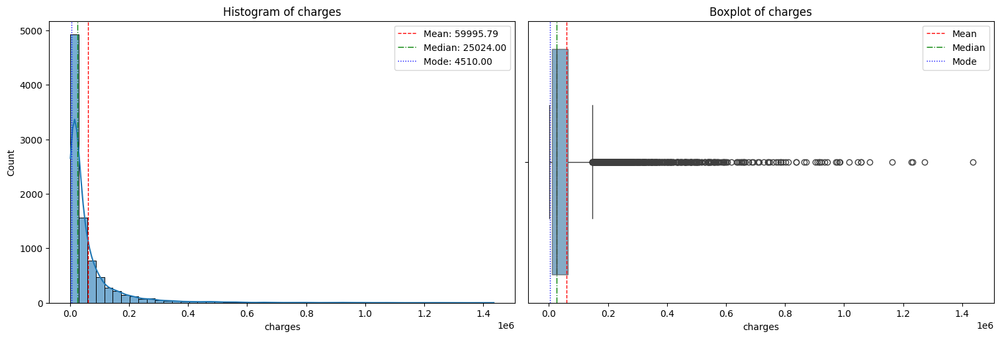

In [8]:
# calculate stats
mean_value = df["charges"].mean()
median_value = df["charges"].median()
mode_value = df["charges"].mode()[0]

# figure
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)

# histogram
sns.histplot(df["charges"].dropna(), kde=True, bins=50, ax=axes[0], alpha=0.6)
axes[0].set_title("Histogram of charges")

# add mean, median, mode
axes[0].axvline(mean_value, color="red", linestyle="--", linewidth=1, label=f"Mean: {mean_value:.2f}")
axes[0].axvline(median_value, color="green", linestyle="-.", linewidth=1, label=f"Median: {median_value:.2f}")
axes[0].axvline(mode_value, color="blue", linestyle=":", linewidth=1, label=f"Mode: {mode_value:.2f}")
axes[0].legend()


# boxplot
box = sns.boxplot(x=df["charges"].dropna(), ax=axes[1])
# set alpha on the box patch
for patch in box.patches:
    patch.set_alpha(0.6)
# set alpha on fliers (outliers)
for flier in box.collections:
    flier.set_alpha(0.6)

axes[1].set_title("Boxplot of charges")
# add same vertical lines
axes[1].axvline(mean_value, color="red", linestyle="--", linewidth=1, label="Mean")
axes[1].axvline(median_value, color="green", linestyle="-.", linewidth=1, label="Median")
axes[1].axvline(mode_value, color="blue", linestyle=":", linewidth=1, label="Mode")
axes[1].legend()

plt.show()

**Histogram analysis of target variable (`charges`)**

- **Mean:** 59,995.79  
- **Median:** 25,024.00  
- **Mode:** 4,510.00  

---

**Distribution shape**
- The distribution of `charges` is **right-skewed**.  
- High charge values **pull the mean upward** relative to the median.  

---

**Outlier consideration**
- These outliers are **need to considered** in the next step.
---

# **4. Basic data exploration**

---

In this step, we classify the variables as categorical or continuous and record the count of each type.

In [9]:
def classify_features(df):
    feature_types = {}
    categorical_features, numerical_features = [], []

    for column in df.columns:
        unique_values = df[column].nunique(dropna=True)

        # Using unuique() to classified the categorical and continuous
        if unique_values < 20:
            feature_types[column] = 'Categorical'
            categorical_features.append(column)
        else:
            feature_types[column] = 'Numerical'
            numerical_features.append(column)

    counts = {
        "Categorical": len(categorical_features),
        "Numerical": len(numerical_features)
    }

    return feature_types, categorical_features, numerical_features, counts

# Usage
feature_types, categorical_features, numerical_features, counts = classify_features(df)

print(f"Categorical Features ({len(categorical_features)}): {categorical_features}")
print(f"Numerical Features ({len(numerical_features)}): {numerical_features}")
print(f"Counts: {counts}")

Categorical Features (16): ['death', 'sex', 'hospdead', 'dzgroup', 'dzclass', 'num.co', 'income', 'scoma', 'race', 'diabetes', 'dementia', 'ca', 'dnr', 'adlp', 'adls', 'sfdm2']
Numerical Features (32): ['id', 'age', 'slos', 'd.time', 'edu', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc']
Counts: {'Categorical': 16, 'Numerical': 32}


In [10]:
# Basic info
info_df = pd.DataFrame({
    "dtype": df.dtypes,
    "non_null": df.notnull().sum(),
    "null": df.isnull().sum(),
    "unique": df.nunique()
})
info_df.index.name = "column"
info_df.reset_index(inplace=True)

# Add feature type column from classification
info_df["feature_type"] = info_df["column"].map(feature_types)
info_df

,column,dtype,non_null,null,unique,feature_type
0,id,int64,9105,0,9105,Numerical
1,age,float64,9105,0,7323,Numerical
2,death,int64,9105,0,2,Categorical
3,sex,object,9105,0,2,Categorical
4,hospdead,int64,9105,0,2,Categorical
5,slos,int64,9105,0,167,Numerical
6,d.time,int64,9105,0,1724,Numerical
7,dzgroup,object,9105,0,8,Categorical
8,dzclass,object,9105,0,4,Categorical
9,num.co,int64,9105,0,10,Categorical


In [11]:
df.head()

column,id,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,...,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
0,1,62.84998,0,male,0,5,2029,Lung Cancer,Cancer,0,...,1.199951,141.0,7.459961,NaN,NaN,NaN,7.0,7.0,NaN,7.0
1,2,60.33899,1,female,1,4,4,Cirrhosis,COPD/CHF/Cirrhosis,2,...,5.500000,132.0,7.250000,NaN,NaN,NaN,NaN,1.0,<2 mo. follow-up,1.0
2,3,52.74698,1,female,0,17,47,Cirrhosis,COPD/CHF/Cirrhosis,2,...,2.000000,134.0,7.459961,NaN,NaN,NaN,1.0,0.0,<2 mo. follow-up,0.0
3,4,42.38498,1,female,0,3,133,Lung Cancer,Cancer,2,...,0.799927,139.0,NaN,NaN,NaN,NaN,0.0,0.0,no(M2 and SIP pres),0.0
4,5,79.88495,0,female,0,16,2029,ARF/MOSF w/Sepsis,ARF/MOSF,1,...,0.799927,143.0,7.509766,NaN,NaN,NaN,NaN,2.0,no(M2 and SIP pres),2.0


In [12]:
df.describe(include='all')

column,id,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,...,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
count,9105.000000,9105.000000,9105.000000,9105,9105.000000,9105.000000,9105.000000,9105,9105,9105.000000,...,9038.000000,9104.000000,6821.000000,4605.000000,4753.000000,4243.000000,3464.000000,6238.000000,7705,9105.000000
unique,NaN,NaN,NaN,2,NaN,NaN,NaN,8,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,NaN
top,NaN,NaN,NaN,male,NaN,NaN,NaN,ARF/MOSF w/Sepsis,ARF/MOSF,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,NaN
freq,NaN,NaN,NaN,5125,NaN,NaN,NaN,3515,4227,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3123,NaN
mean,4553.000000,62.650823,0.681054,NaN,0.259198,17.863042,478.449863,NaN,NaN,1.868644,...,1.770961,137.568541,7.415364,159.873398,32.349463,2191.546047,1.157910,1.637384,NaN,1.888272
std,2628.531434,15.593710,0.466094,NaN,0.438219,22.006440,560.383272,NaN,NaN,1.344409,...,1.686041,6.029326,0.080563,88.391541,26.792288,1455.245777,1.739672,2.231358,NaN,2.003763
min,1.000000,18.041990,0.000000,NaN,0.000000,3.000000,3.000000,NaN,NaN,0.000000,...,0.099991,110.000000,6.829102,0.000000,1.000000,0.000000,0.000000,0.000000,NaN,0.000000
25%,2277.000000,52.797000,0.000000,NaN,0.000000,6.000000,26.000000,NaN,NaN,1.000000,...,0.899902,134.000000,7.379883,103.000000,14.000000,1165.500000,0.000000,0.000000,NaN,0.000000
50%,4553.000000,64.856990,1.000000,NaN,0.000000,11.000000,233.000000,NaN,NaN,2.000000,...,1.199951,137.000000,7.419922,135.000000,23.000000,1968.000000,0.000000,1.000000,NaN,1.000000
75%,6829.000000,73.998960,1.000000,NaN,1.000000,20.000000,761.000000,NaN,NaN,3.000000,...,1.899902,141.000000,7.469727,188.000000,42.000000,3000.000000,2.000000,3.000000,NaN,3.000000


## **4.1. Basic data exploration results**

---

The selected columns in this step are **not final**; further study will refine the list.  

**Note:** The identifier (`id`) is **excluded**, since it is neither a feature nor a target variable.

**Doubt** for the features that model-predicted or derived can cause a leakage.

---

**Selected Features**

- **age** – Continuous (numeric). Selected  
- **death** – Categorical (binary). Selected  
- **sex** – Categorical (nominal). Selected  
- **hospdead** – Categorical (binary). Selected  
- **slos** – Continuous (numeric, days). Selected  
- **d.time** – Continuous (numeric, days). Selected  
- **dzgroup** – Categorical (nominal, detailed disease group). Selected  
- **dzclass** – Categorical (nominal, broad disease class). Selected  
- **num.co** – Categorical (integer count). Selected  
- **edu** – Continuous (numeric years). Selected  
- **income** – Categorical (ordinal levels). Selected  
- **scoma** – Categorical (nominal). Selected,**Doubt**  
- **totcst** – Continuous (numeric, cost ratio). Selected,**Doubt**
- **totmcst** – Continuous (numeric, micro cost). Selected,**Doubt**
- **avtisst** – Continuous (numeric score). Selected  
- **race** – Categorical (nominal). Selected  
- **sps** – Continuous (numeric score). Selected,**Doubt**   
- **aps** – Continuous (numeric score). Selected  
- **surv2m** – Continuous (predicted survival). Selected,**Doubt**   
- **surv6m** – Continuous (predicted survival). Selected,**Doubt**   
- **hday** – Continuous (numeric, day count). Selected  
- **diabetes** – Categorical (binary). Selected  
- **dementia** – Categorical (binary). Selected  
- **ca** – Categorical (ordinal: yes, metastatic, no). Selected  
- **prg2m** – Continuous (physician estimate). Selected,**Doubt**   
- **prg6m** – Continuous (physician estimate). Selected,**Doubt**   
- **dnr** – Categorical (nominal). Selected  
- **dnrday** – Continuous (numeric, relative day). Selected  
- **meanbp** – Continuous (numeric). Selected  
- **wblc** – Continuous (numeric). Selected  
- **hrt** – Continuous (numeric). Selected  
- **resp** – Continuous (numeric). Selected  
- **temp** – Continuous (numeric). Selected  
- **pafi** – Continuous (numeric ratio). Selected  
- **alb** – Continuous (numeric, g/dL). Selected  
- **bili** – Continuous (numeric, mg/dL). Selected  
- **crea** – Continuous (numeric, mg/dL). Selected  
- **sod** – Continuous (numeric, mmol/L). Selected  
- **ph** – Continuous (numeric). Selected  
- **glucose** – Continuous (numeric, mg/dL). Selected  
- **bun** – Continuous (numeric, mg/dL). Selected  
- **urine** – Continuous (numeric, mL). Selected  
- **adlp** – Categorical (score). Selected  
- **adls** – Categorical (score). Selected  
- **sfdm2** – Categorical (ordinal disability scale 1–5). Selected  
- **adlsc** – Continuous (calibrated ADL). Selected  
- **charges** – Continuous (numeric, cost). **Target Variable**  

---

**Feature Type Counts**
- Continuous (numeric): **30**  
- Categorical (nominal / ordinal / binary): **16**  
- **Total features:** 46  

---

**Target Variable**
- Continuous (numeric): **1** (`charges`)  

---

**Overall Variables**
- **47 variables** in total (features + target)  

---

**Summary**
- At this stage, no variables were removed as useless.  
**All variables are selected and retained** for further analysis.
- **Doubt** for `totcst`, `totmcst`, `scoma`, `sps`, `surv2m`, `surv6m`, `prg2m`, `prg6m`

---

# **5. Visual exploratory data analysis (EDA) for data distribution and feature selection based on data distribution**

---

## **5.1. Visualize distribution of categorical predictor variables**

---

**Categorical Predictors (16):**  
`death`, `sex`, `hospdead`, `dzgroup`, `dzclass`, `num.co`, `income`, `scoma`,  
`race`, `diabetes`, `dementia`, `ca`, `dnr`, `adlp`, `adls`, `sfdm2`  

Bar charts are used to visualize how the data is distributed across categorical columns.

In [13]:
def plot_categorical_bars(df, cols, n_cols=3, top=None, normalize=False):
    n = len(cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 5*n_rows), squeeze=False, constrained_layout=True)
    axes = axes.flatten()

    for i, col in enumerate(cols):
        ax = axes[i]
        s = df[col].astype("object").where(df[col].notna(), "Missing")
        counts = s.value_counts(dropna=False)

        if top is not None:
            counts = counts.head(top)
        if normalize:
            counts = counts / counts.sum() * 100

        counts.plot(kind="bar", ax=ax, color="steelblue", edgecolor="black", alpha=0.6)
        ax.set_title(col, fontsize=10)
        ax.tick_params(axis="x", labelrotation=90)
        ax.grid(axis="y", linestyle=":", linewidth=0.5, alpha=0.6)
        ax.set_ylabel("% of rows" if normalize else "Count")

    # hide unused subplots
    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle("Bar charts of categorical features", fontsize=14)
    plt.show()

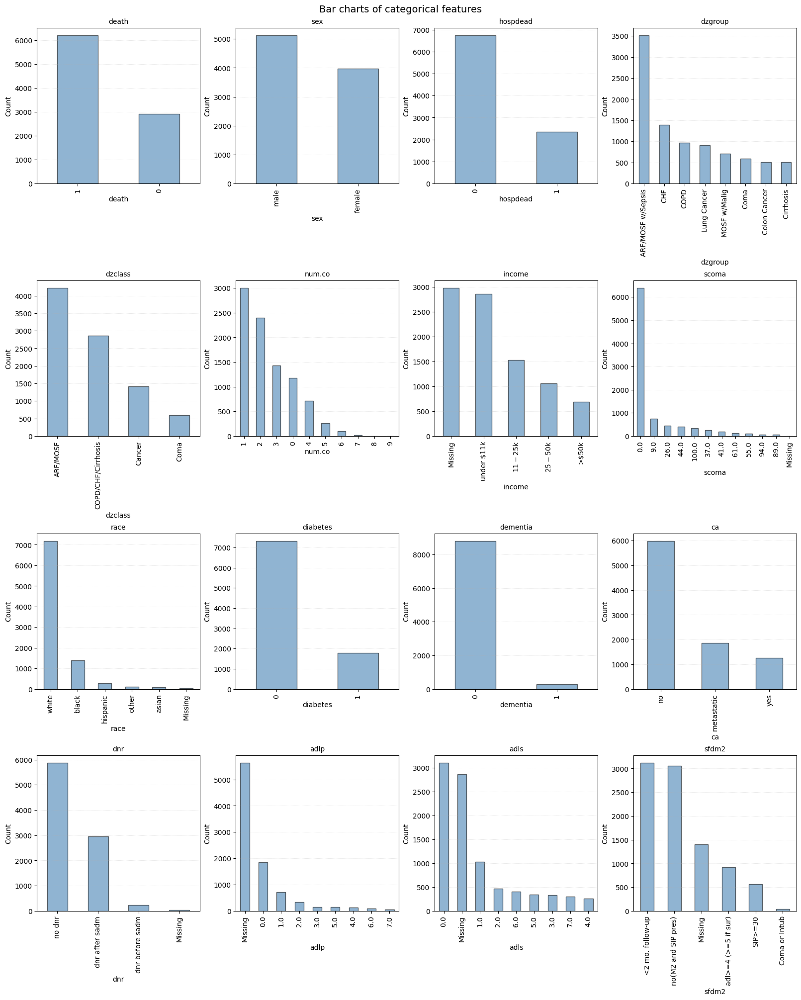

In [14]:
plot_categorical_bars(
    df, cols=['death', 'sex', 'hospdead', 'dzgroup', 'dzclass', 'num.co', 'income', 'scoma', 'race', 'diabetes', 'dementia', 'ca', 'dnr', 'adlp', 'adls', 'sfdm2'],
    n_cols=4,
    top=None,
    normalize=False
)

### **5.1.1. Bar charts interpretation**

---

All categorical variables are **retained** for further analysis.  
Some are marked as **doubt** due to **imbalance**, **missing data**, or **potential multicollinearity**.  

---

Selected Categorical Variables
- **sex** – Selected  
- **dzgroup** – Selected
- **dzclass** – Selected
- **num.co** – Selected  
- **income** – Selected **(Doubt — missing values)**  
- **race** – Selected **(Doubt — imbalance)**  
- **diabetes** – Selected  
- **dementia** – Selected **(Doubt — imbalance)**  
- **ca** – Selected  
- **dnr** – Selected  
- **death** – Selected  
- **hospdead** – Selected  
- **adlp** – Selected **(Doubt — missing values)**  
- **adls** – Selected **(Doubt — missing values)**  
- **sfdm2** – Selected  

---

**Summary**
- No categorical columns are removed at this stage.  
- **All 16 categorical variables are retained** for further analysis.  
- Since visual interpretation is **less reliable than statistical testing**, we preserve all variables for now.

---

## **5.2. Visualize distribution of continuous predictor variables**

---

**Continuous Predictors (30):**  
`age`, `slos`, `d.time`, `edu`, `totcst`, `totmcst`, `avtisst`, `sps`, `aps`,  
`surv2m`, `surv6m`, `hday`, `prg2m`, `prg6m`, `dnrday`, `meanbp`, `wblc`,  
`hrt`, `resp`, `temp`, `pafi`, `alb`, `bili`, `crea`, `sod`, `ph`, `glucose`,  
`bun`, `urine`, `adlsc`  

**Continuous Target (1):**  
`charges`  

Histograms are used to visualize the distribution of data across continuous variables.

---

### **5.2.1. Visualize distribution of continuous predictor variables in the data using histograms**

---

In [15]:
def plot_hist_grid(
    df, cols, bins=30, n_cols=4,
    show_kde=True,
    kde_bw=None
):
    n = len(cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows), constrained_layout=True)
    axes = np.array(axes).reshape(-1)

    for i, col in enumerate(cols):
        series = df[col].replace([np.inf, -np.inf], np.nan).dropna()
        if series.size == 0:
            axes[i].set_visible(False)
            continue

        counts = axes[i].hist(series, bins=bins, color="steelblue", edgecolor="black", alpha=0.6)

        if show_kde and series.size > 1 and np.ptp(series) > 0:
            kde = gaussian_kde(series, bw_method=kde_bw)
            x = np.linspace(series.min(), series.max(), 512)
            bin_edges = counts[1]
            bin_width = (bin_edges[1] - bin_edges[0]) if len(bin_edges) > 1 else 1.0
            y = kde(x) * series.size * bin_width
            axes[i].plot(x, y, linewidth=1, color="steelblue")

        mean_value = float(series.mean())
        median_value = float(series.median())
        mode_series = series.mode(dropna=True)
        mode_value = float(mode_series.iloc[0]) if not mode_series.empty else mean_value

        axes[i].axvline(mean_value, color="red", linestyle="--", linewidth=0.8)
        axes[i].axvline(median_value, color="green", linestyle="-.", linewidth=0.8)
        axes[i].axvline(mode_value, color="blue", linestyle=":", linewidth=0.8)

        axes[i].set_title(col, fontsize=10)
        axes[i].set_xlabel("")
        axes[i].set_ylabel("Frequency")
        axes[i].grid(axis="y", linestyle=":", alpha=0.6)

    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle("Histograms of numeric features", fontsize=14)
    plt.show()


In [16]:
def summarize_numeric(df, cols):
    summary = {}
    for col in cols:
        series = df[col].replace([np.inf, -np.inf], np.nan).dropna()
        if series.size > 0:
            mean_value = float(series.mean())
            median_value = float(series.median())
            mode_series = series.mode(dropna=True)
            mode_value = float(mode_series.iloc[0]) if not mode_series.empty else mean_value
            summary[col] = {
                "Mean": mean_value,
                "Median": median_value,
                "Mode": mode_value
            }
    return pd.DataFrame(summary).T

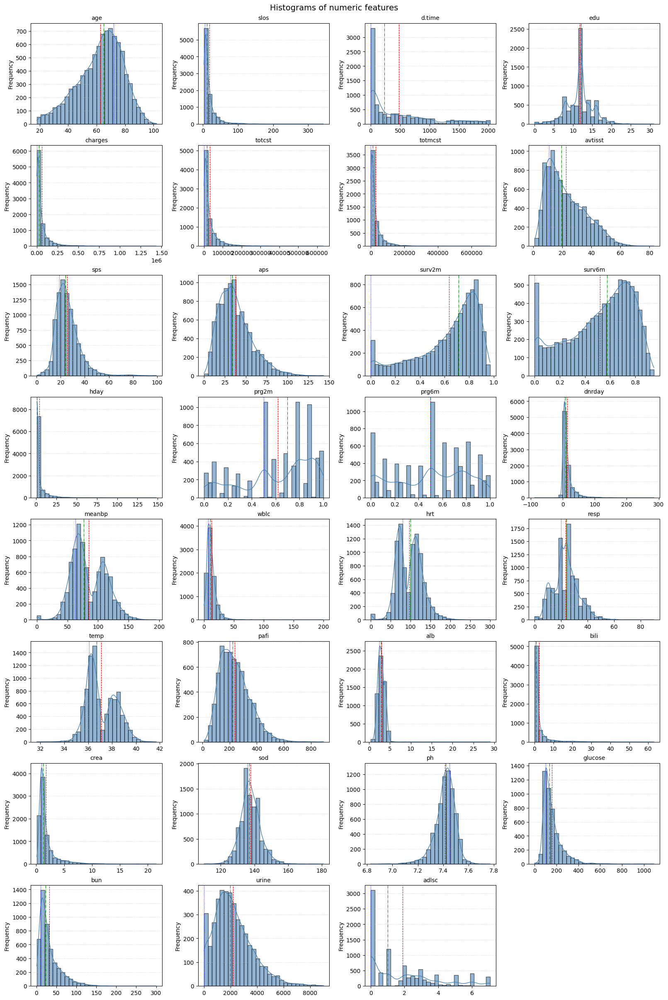

In [17]:
num_cols = ['age', 'slos', 'd.time', 'edu', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc']
plot_hist_grid(df, num_cols, bins=30, n_cols=4)

**Visualize the mean, median, and mode.** ✅

---

In [18]:
summarize_numeric(df, num_cols) # mean, median, mode

,Mean,Median,Mode
age,62.650823,64.856990,71.996950
slos,17.863042,11.000000,5.000000
d.time,478.449863,233.000000,4.000000
edu,11.747691,12.000000,12.000000
charges,59995.787811,25024.000000,4510.000000
totcst,30825.867768,14452.734400,0.000000
totmcst,28828.877838,13223.500000,0.000000
avtisst,22.610928,19.500000,11.000000
sps,25.525872,23.898438,18.898438
aps,37.597979,34.000000,32.000000


### **5.2.2. Visualize distribution of continuous predictor variables in the data using box plots**

---

In [19]:
def plot_box_grid(df, cols, n_cols=4):
    n = len(cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows), constrained_layout=True)
    axes = axes.flatten()

    for i, col in enumerate(cols):
        series = df[col].dropna()
        axes[i].boxplot(series, vert=True, patch_artist=True,
                        boxprops=dict(facecolor="lightblue", color="black"),
                        medianprops=dict(color="red"),
                        whiskerprops=dict(color="black"),
                        capprops=dict(color="black"))
        axes[i].set_title(col, fontsize=10)
        axes[i].set_ylabel("")
        axes[i].grid(axis="y", linestyle=":", alpha=0.6)

    # hide any unused subplots
    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle("Boxplots of numeric features", fontsize=14)
    plt.show()

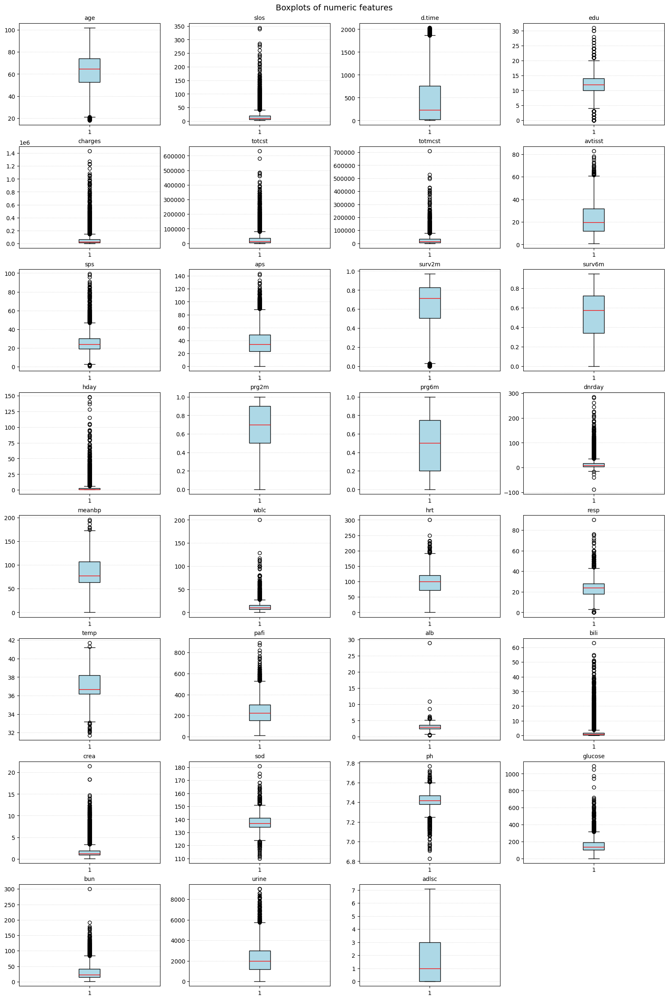

In [20]:
num_cols = ['age', 'slos', 'd.time', 'edu', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc']
plot_box_grid(df, num_cols, n_cols=4)

### **5.2.3. Histogram and Boxplot Interpretation**

---

- **age** – Selected. Normal Distribution; acceptable.
- **slos** – Selected. Strong positive skew; acceptable.  
- **d.time** – Selected. Strong positive skew; acceptable.  
- **edu** – Selected. Slight positive skew; acceptable.  
- **totcst** – Selected. Strong positive skew; acceptable.  
- **totmcst** – Selected. Strong positive skew; acceptable.  
- **avtisst** – Selected. Strong positive skew; acceptable.  
- **sps** – Selected. Approximately normal with slight right skew; acceptable.  
- **aps** – Selected. Approximately normal with slight right skew; acceptable.  
- **surv2m** – Selected. Good distribution; acceptable.  
- **surv6m** – Selected. Good distribution; acceptable.  
- **hday** – Selected. Strong positive skew; acceptable.  
- **prg2m** – Selected. Irregular with spikes; acceptable.  
- **prg6m** – Selected. Irregular with spikes; acceptable.  
- **dnrday** – Selected. Strong positive skew, concentrated at zero; acceptable.  
- **meanbp** – Selected. Bimodal distribution; acceptable.  
- **wblc** – Selected. Strong positive skew; acceptable.  
- **hrt** – Selected. Bimodal, peaks ~80 and ~120 bpm; acceptable.  
- **resp** – Selected. Approximately normal with slight right skew; acceptable.  
- **temp** – Selected. Bimodal, reflecting fever vs. hypothermia; acceptable.  
- **pafi** – Selected. Slight positive skew; acceptable.  
- **alb** – Selected. Strong positive skew; acceptable.  
- **bili** – Selected. Strong positive skew; acceptable.  
- **crea** – Selected. Strong positive skew; acceptable.  
- **sod** – Selected. Approximately normal with slight skew; acceptable.  
- **ph** – Selected. Approximately normal; acceptable.  
- **glucose** – Selected. Strong positive skew; acceptable.  
- **bun** – Selected. Strong positive skew; acceptable.  
- **urine** – Selected. Slight positive skew; acceptable.  
- **adlsc** – Selected. Irregular with spikes; acceptable.  

---

**Summary**
- No continuous variables removed.  
- **All 30 predictors are retained** for further analysis.  
- Since human visual inspection is **less reliable than statistical tests**, we preserve all variables for now.

---


## **5.3. Visual exploratory data and basic data exploration results**

---

### **Key Assumptions After EDA**

From our EDA of the SUPPORT880 dataset, we found that **it contains clinical measurements of hospitalized patients across nine different diseases.** Some values appear extreme compared to typical ranges but are clinically valid in rare conditions (e.g., a 250 BPM heart rate in tachycardia). **To keep this clinical variation and avoid losing important information, we retained all continuous variables rather than filtering them out**.

We also set key assumptions for our model to guide the next steps in analysis.

---

**Key Assumptions**

1. **Data Transformation May Be Required:**  
   The `charges` variable is highly skewed. A log transformation will be applied to make the distribution more suitable for linear modeling.

2. **Outliers Are Not Errors in Clinical Measurements:**  
   Outliers reflect real, clinically important cases (e.g., very high WBC counts) and **must be retained**, since they are crucial for predicting high costs.

3. **Non-linear Relationship Considered:**
   From the EDA, we observed that the target variable contains many **outliers** and a **heavily skewed distribution**. This indicates that charges do not increase at a **constant rate** but instead may **rise sharply under certain conditions**. Therefore, the relationship between predictors and the target is unlikely to be strictly linear, and **non-linear patterns should be considered**.

---

### **Quick Summary**

**Our Model 1 may apply data transformation, without outlier treatment, and consider the non-linear relationship between the target and features.**

---


## **5.4. Data Leakage**

Some variables in the dataset were found to cause or derive from data leakage. Since these features contain information that would not be available at prediction time, they will be **excluded from the modeling process**. The detailed reasoning for their removal will be explained in the **session below**.

---

**Data Leakage Removal**
Variables removed due to data leakage:  
`totcst`, `totmcst`, `scoma`, `sps`, `surv2m`, `surv6m`, `prg2m`, `prg6m`

- **`totcst` (Total Cost):** Directly overlaps with target `charges` → leakage.  
- **`totmcst` (Total Medical Cost):** Another direct cost component tied to `charges`.  
- **`scome` (Coma Score based on Glasgow scale ):** Encodes info from a pre-trained model → indirect leakage.
- **`sps` (Simplified Physiology Score):** Encodes info from a pre-trained model → indirect leakage.  
- **`surv2m` (2-Month Survival Estimate):** Uses future survival outcomes → not available at admission.  
- **`surv6m` (6-Month Survival Estimate):** Same issue as `surv2m` → future information leakage.  
- **`prg2m` (2-Month Physician Prognosis):** Subjective prognosis dependent on outcomes → leakage.  
- **`prg6m` (6-Month Physician Prognosis):** Same as `prg2m`, extended to 6 months.  

---

**Remaining Features → 38**  
- **Categorical:** 15  
- **Continuous:** 23  

---

# **6. Outlier Treatment**

---

* **age** – Keep outliers.  
* **slos (Length of Stay)** - Keep outliers.
* **d.time (Follow-up)** – Keep outliers.  
* **edu (Education)** – Keep outliers.     
* **avtisst (Activities)** - Kepp outliers.
* **aps (Clinical Scores)** – Keep outliers.   
* **hday (Hospital Day)** – Keep outliers.  
* **dnrday (DNR Day)** – Keep outliers.  
* **meanbp (Blood Pressure)** – Keep outliers.  
* **wblc (White Blood Cell Count)** – Keep outliers.  
* **hrt (Heart Rate)** – Keep outliers.  
* **resp (Respiration Rate)** – Keep outliers.  
* **temp (Temperature)** – Keep outliers.  
* **pafi (PaO₂/FiO₂ ratio)** – Keep outliers.  
* **alb (Albumin)** – Keep outliers.  
* **bili (Bilirubin)** – Keep outliers.  
* **crea (Creatinine)** – Keep outliers.  
* **sod (Sodium)** – Keep outliers.  
* **ph (Blood pH)** – Keep outliers.  
* **glucose** – Keep outliers.  
* **bun (Blood Urea Nitrogen)** – Keep outliers.  
* **urine** – Keep outliers.  
* **adlsc (ADL Score)** – Keep outliers.  
 ---

**Summary of Outlier**
- **No outliers removed**  
  All extreme values are considered **clinically valid** ➡ According to the assumption.
---

In [21]:
leak_col = ['totcst', 'totmcst', 'scoma', 'sps', 'surv2m', 'surv6m', 'prg2m', 'prg6m']
df = df.drop(columns=leak_col)
print(df.shape)

(9105, 40)


# **7. Missing value treatment**

---

If a column has **more than 30% data missing values**, then missing value treatment cannot be done. That column must be rejected because too much information is missing.

There are below options for treating missing values in data.
* Impute the missing values with **MEAN** or **MEDIAN** value for **continuous variables**
* Impute the missing values with **MODE** value for **categorical variables**

---

## **7.1 Missing Values Treatment for Continuous Features**
---

### **7.1.1. Removing the missing values**

---

#### **Check the missing values**

- Remove values with more than 30% missing

In [22]:
continuous_features = [
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc' ,'charges'
]

missing = df[continuous_features].isnull().sum()
missing_percent = (missing / len(df)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

         Missing Values  Percentage
column                             
urine              4862       53.40
glucose            4500       49.42
bun                4352       47.80
alb                3372       37.03
bili               2601       28.57
pafi               2325       25.54
ph                 2284       25.09
edu                1634       17.95
wblc                212        2.33
charges             172        1.89
avtisst              82        0.90
crea                 67        0.74
dnrday               30        0.33
aps                   1        0.01
hrt                   1        0.01
resp                  1        0.01
temp                  1        0.01
meanbp                1        0.01
sod                   1        0.01
d.time                0        0.00
hday                  0        0.00
age                   0        0.00
slos                  0        0.00
adlsc                 0        0.00


In [23]:
# features to drop if more than 30% missing
to_drop = missing_table[missing_table['Percentage'] > 30].index.tolist()

# drop them from df
df_clean = df.drop(columns=to_drop)
print("Dropped features:", to_drop)
print("New shape:", df_clean.shape)


Dropped features: ['alb', 'glucose', 'bun', 'urine']
New shape: (9105, 36)


**Features with >30% Missing Values Removed**  
- `alb`  
- `glucose`  
- `bun`  
- `urine`  

---

**Remaining Features → 34**  
- **Categorical:** 15  
- **Continuous:** 19  


### **7.1.2. Filling the missing values**

---

- If a feature is **skewed**, fill missing values with the **median** since it is less affected by outliers

- If a feature is **not skewed**, fill missing values with the **mean** instead.

---

#### **Check which features have missing values**

In [24]:
# filter: greater than 0 and less than 30%
filtered_table = missing_table[
    (missing_table['Missing Values'] > 0) &
    (missing_table['Percentage'] < 30)
]

# sort by percentage of missing values, descending
filtered_table = filtered_table

print(filtered_table)

         Missing Values  Percentage
column                             
edu                1634       17.95
avtisst              82        0.90
aps                   1        0.01
dnrday               30        0.33
meanbp                1        0.01
wblc                212        2.33
hrt                   1        0.01
resp                  1        0.01
temp                  1        0.01
pafi               2325       25.54
bili               2601       28.57
crea                 67        0.74
sod                   1        0.01
ph                 2284       25.09
charges             172        1.89


**Fill Missing Values with Mean**

From the Histogram and Boxplot Interpretation (Section 5.2.3), the following features showed **approximately normal distributions**:  

- `age` ,`meanbp` ,`hrt` ,`temp` ,`sod` ,`ph`  

Their missing values are filled with the **mean** of each feature.


In [25]:
mean_features = ['age', 'meanbp', 'hrt', 'temp', 'sod', 'ph']
df_clean[mean_features] = df_clean[mean_features].fillna(df_clean[mean_features].mean())

**Fill Missing Values with Median**

All the features left have skewed distributions, so missing values are filled with the median

In [26]:
# choose the columns you care about
cols_to_check = continuous_features  # your list

# build missing table on the original df
missing = df[cols_to_check].isnull().sum()
missing_percent = (missing / len(df)) * 100
missing_table = pd.DataFrame({
    "Missing Values": missing,
    "Percentage": missing_percent
})

# pick columns with 0% < missing < 30%
mask = (missing_table["Missing Values"] > 0) & (missing_table["Percentage"] < 30)
to_impute = missing_table.index[mask].tolist()

# fill with column medians and merge into df_clean
medians = df_clean[to_impute].median()
df_clean[to_impute] = df_clean[to_impute].fillna(medians)

# quick sanity check (shows only any leftovers)
print("Imputed (median):", to_impute)
print(df_clean[to_impute].isnull().sum()[lambda s: s > 0])

Imputed (median): ['edu', 'avtisst', 'aps', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'bili', 'crea', 'sod', 'ph', 'charges']
Series([], dtype: int64)


### **7.1.3. Result after missing values treatment for continuous features**

---

In [27]:
new_continuous_features = [
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','bili',
    'crea', 'sod','ph','adlsc' ,'charges'
]


missing_clean = df_clean[new_continuous_features].isnull().sum()
missing_percent_clean = (missing_clean / len(df_clean[new_continuous_features])) * 100

missing_table_clean = pd.DataFrame({
    'Missing Values': missing_clean,
    'Percentage': missing_percent_clean.round(2)
})
print(missing_table_clean.sort_values(by="Percentage", ascending=False))

missing_table_clean = missing_table_clean[missing_table_clean['Missing Values'] > 0]

         Missing Values  Percentage
column                             
age                   0         0.0
slos                  0         0.0
d.time                0         0.0
edu                   0         0.0
avtisst               0         0.0
aps                   0         0.0
hday                  0         0.0
dnrday                0         0.0
meanbp                0         0.0
wblc                  0         0.0
hrt                   0         0.0
resp                  0         0.0
temp                  0         0.0
pafi                  0         0.0
bili                  0         0.0
crea                  0         0.0
sod                   0         0.0
ph                    0         0.0
adlsc                 0         0.0
charges               0         0.0


**Summary**
- No missing values left in continuous features
---

## **7.2. Missing Values Treatment for Categorical Features**

---

### **7.2.1.Removing the missing values**

---

#### **Check the missing values**

- Remove values with more than 30% missing

In [28]:
categorical_features = ['death', 'sex', 'hospdead', 'dzgroup',
          'dzclass', 'num.co', 'income',
          'race', 'diabetes', 'dementia', 'ca',
          'dnr', 'adlp', 'adls', 'sfdm2'],

missing = df[categorical_features[0]].isnull().sum()
missing_percent = (missing / len(df)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
column                              
adlp                5641       61.95
income              2982       32.75
adls                2867       31.49
sfdm2               1400       15.38
race                  42        0.46
dnr                   30        0.33
sex                    0        0.00
num.co                 0        0.00
dzclass                0        0.00
dzgroup                0        0.00
hospdead               0        0.00
death                  0        0.00
ca                     0        0.00
diabetes               0        0.00
dementia               0        0.00


In [29]:
# features to drop if more than 30% missing
to_drop_cat = missing_table[missing_table['Percentage'] > 30].index.tolist()

# drop them from df_clean
df_clean = df_clean.drop(columns=to_drop_cat)

print("Dropped categorical features:", to_drop_cat)
print("New shape:", df_clean.shape)

Dropped categorical features: ['income', 'adlp', 'adls']
New shape: (9105, 33)


### **7.2.2. Filling the missing values**

---

Impute the missing values with **mode** value for categorical variables

In [30]:
mode_features = ['sfdm2','race','dnr']
mode_dict = {col: df_clean[col].mode()[0] for col in mode_features}
df_clean[mode_features] = df_clean[mode_features].fillna(mode_dict)

In [31]:
df_clean = df_clean.drop(columns=df_clean.columns[0])
num_missing_cols = (df_clean.isnull().sum() > 0).sum()

print("Number of features with missing values:", num_missing_cols)
print("New shape:", df_clean.shape)

Number of features with missing values: 0
New shape: (9105, 32)


### **7.2.3. Result after missing values treatment for continuous features**

---

In [32]:
missing = df_clean.isnull().sum()
missing_percent = (missing / len(df_clean)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
column                              
age                    0         0.0
death                  0         0.0
sex                    0         0.0
hospdead               0         0.0
slos                   0         0.0
d.time                 0         0.0
dzgroup                0         0.0
dzclass                0         0.0
num.co                 0         0.0
edu                    0         0.0
charges                0         0.0
avtisst                0         0.0
race                   0         0.0
aps                    0         0.0
hday                   0         0.0
diabetes               0         0.0
dementia               0         0.0
ca                     0         0.0
dnr                    0         0.0
dnrday                 0         0.0
meanbp                 0         0.0
wblc                   0         0.0
hrt                    0         0.0
resp                   0         0.0
temp                   0         0.0
p

**Summary**
- No missing values left in all features

---

## **7.3. Visualization of Histograms and Boxplots After Missing Value Treatment**

---

Visualization with histograms and boxplots after missing value treatment helps confirm whether the imputation preserved the data’s distribution, spread, and outliers without introducing distortions.

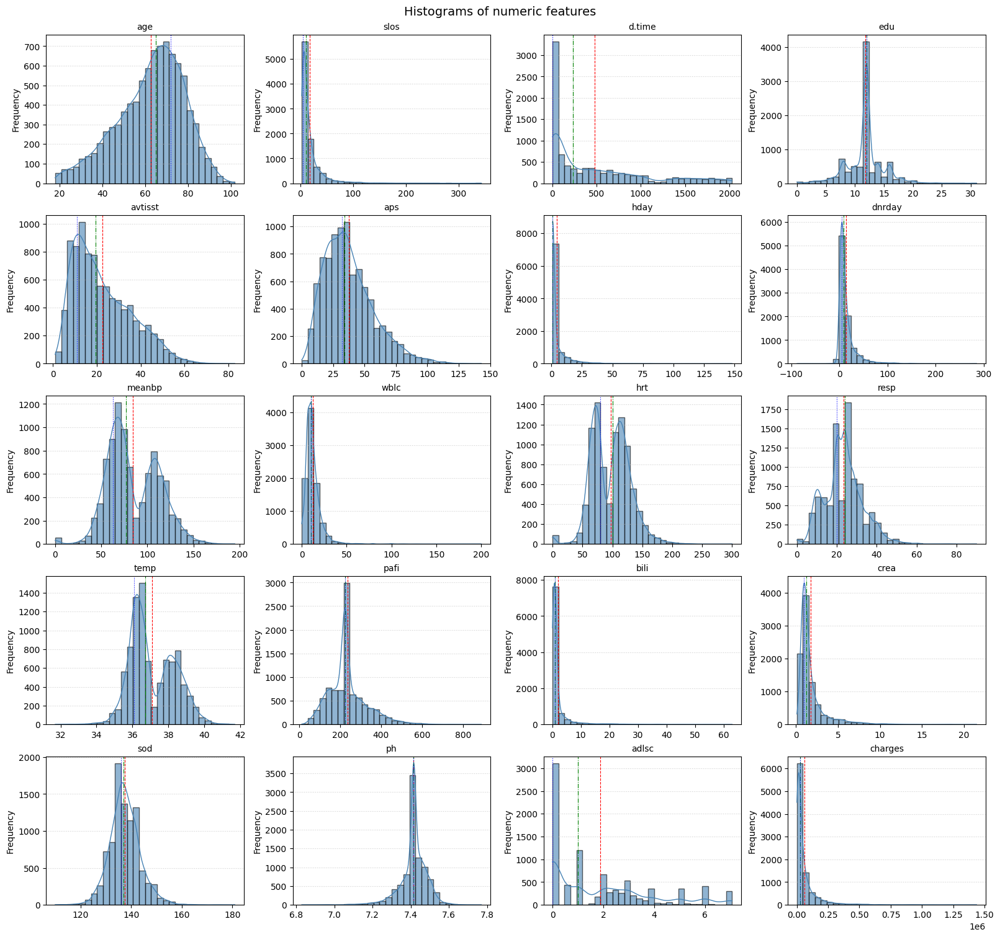

In [33]:
plot_hist_grid(df_clean, new_continuous_features, bins=30, n_cols=4)

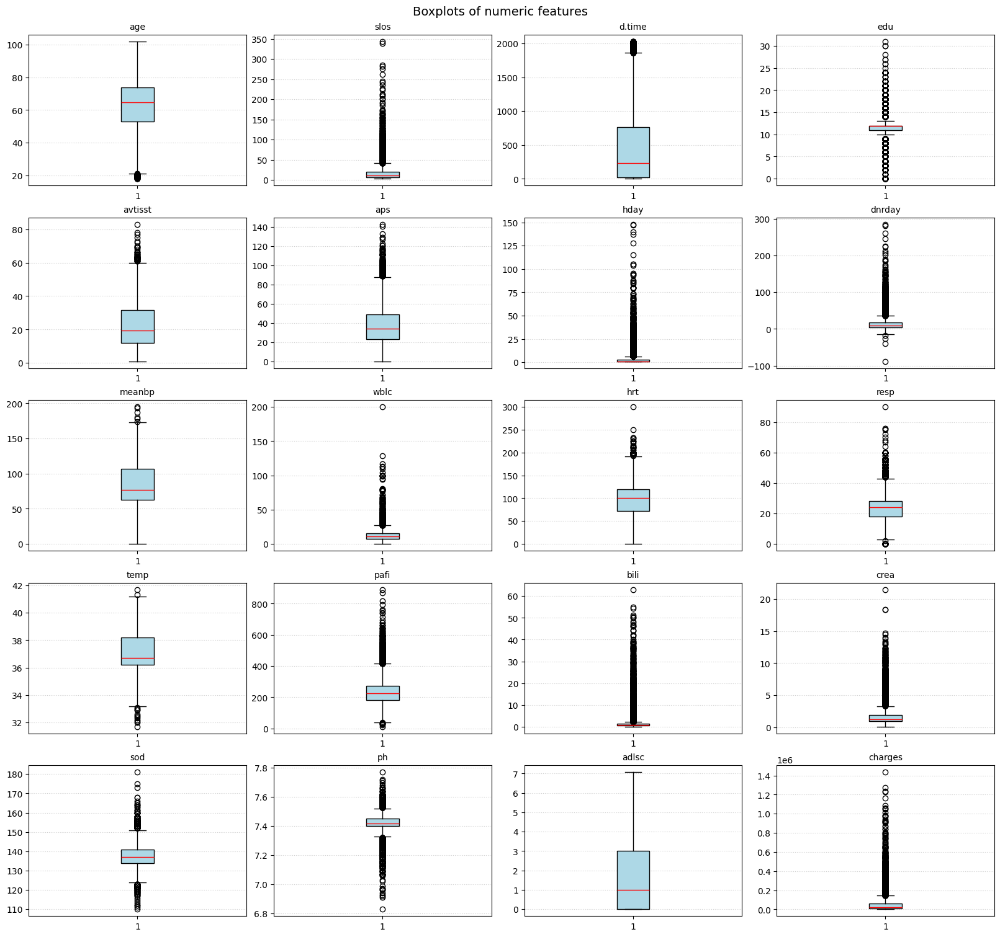

In [34]:
plot_box_grid(df_clean, new_continuous_features, n_cols=4)

**Summary**
- Histograms and boxplots after missing value treatment show that the **data’s distribution and spread remain the same**, indicating the imputation did not distort the dataset.

---

## **7.4. Training and Testing Sample**

---

We do not use the full data for creating the model. Some data is randomly selected and kept aside for checking how good the model is. This is known as Testing Data and the remaining data is called Training data on which the model is built.

---

#### **7.4.1. Splitting the Data**

---

**70% of data is used as Training data** and the rest **30% is used as Tesing data.**

In [35]:
target_variables =  ['charges']
predictor_variables=[
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','bili','crea',
    'sod','ph','adlsc' ,'death', 'sex','hospdead',
    'dzgroup','dzclass', 'num.co', 'race',
    'diabetes', 'dementia', 'ca','dnr', 'sfdm2'
]

In [36]:
X = df_clean[predictor_variables]
y = df_clean[target_variables]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#### **7.4.2. Visualization of Training and Testing Data**
---
To confirm they follow similar distributions, ensuring the split was fair and that the model will be tested on data representative of what it learned during training.

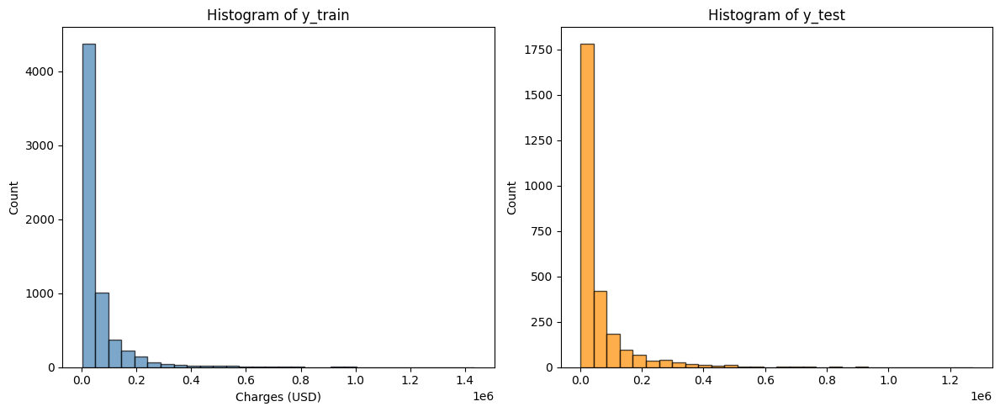

In [37]:
import matplotlib.pyplot as plt

# Plot histograms for y_train and y_test
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(y_train, bins=30, color="steelblue", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_train")
plt.xlabel("Charges (USD)")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.hist(y_test, bins=30, color="darkorange", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_test")
plt.ylabel("Charges (USD)")
plt.ylabel("Count")

plt.tight_layout()
plt.show()


In [38]:
train_df = X_train.copy()
train_df["charges"] = y_train

test_df = X_test.copy()
test_df["charges"] = y_test

print(train_df.shape)
print(test_df.shape)

(6373, 32)
(2732, 32)


**Summary**

- The visualization of training and testing data shows **similar distributions**, confirming that the split is balanced and representative of the overall dataset.  
- The training set contains **6,373 instances**.  
- The testing set contains **2,732 instances**.  

---

# **8. Feature Selection by Visual Correlation Analysis and Statistical Measurement**

---

In this case study the Target variable is Continuous, hence below two scenarios will be present

* Continuous Target Variable Vs Continuous Predictor
* Continuous Target Variable Vs Categorical Predictor
---

## **8.1. Relationship exploration: Continuous Vs Continuous -- Scatter Charts**
---

### **8.1.1. Visual exploration**
---

In [39]:
def plot_scatter_grid(train_df, x_cols, y_col, n_cols=3):
    n = len(x_cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(5*n_cols, 4*n_rows),
                             constrained_layout=True)
    axes = axes.flatten()

    for i, col in enumerate(x_cols):
        axes[i].scatter(train_df[col], train_df[y_col], alpha=0.5,
                        color="steelblue", edgecolor="black")
        axes[i].set_title(f"{col} vs {y_col}", fontsize=9)
        axes[i].set_xlabel(col)
        axes[i].set_ylabel(y_col)
        axes[i].grid(linestyle=":", alpha=0.6)

    # hide any unused subplots
    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle(f"Scatter plots vs {y_col}", fontsize=14)
    plt.show()

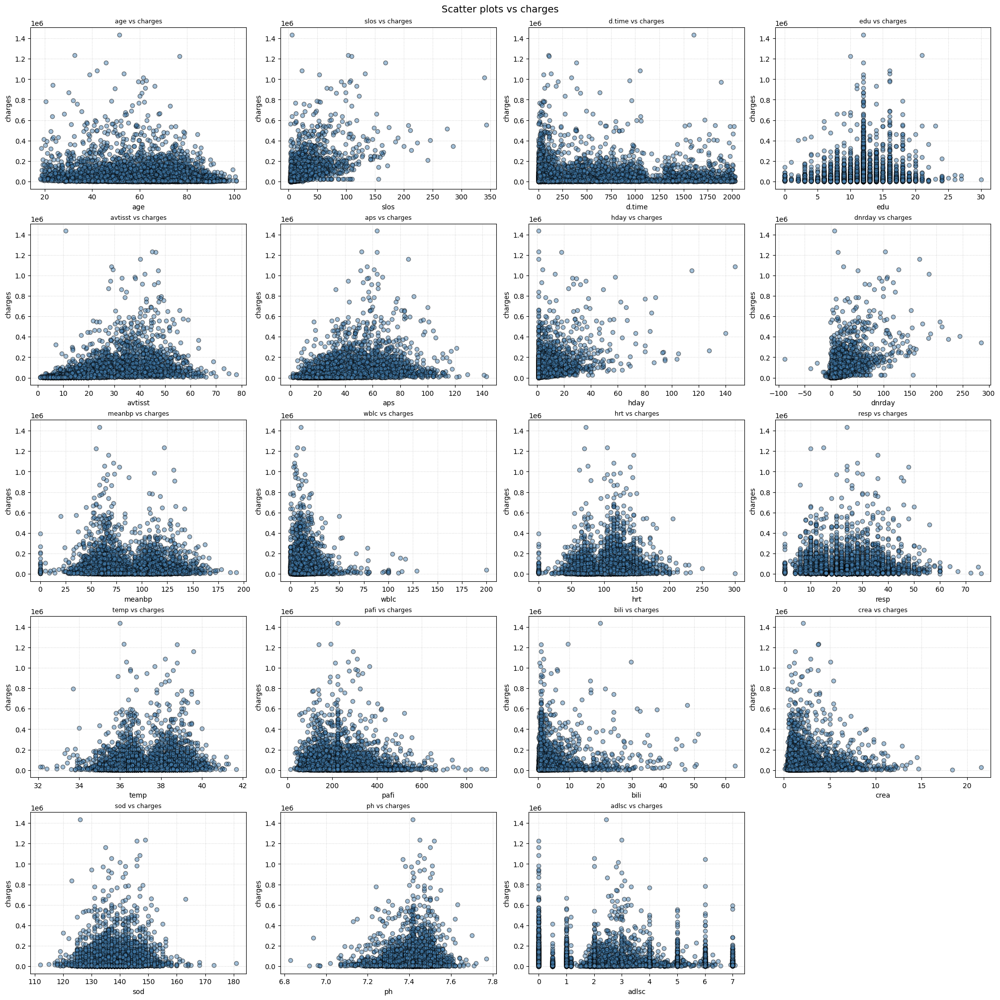

In [40]:
plot_scatter_grid(train_df, x_cols=[
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','bili','crea',
    'sod','ph','adlsc'
    ]
    ,y_col='charges', n_cols=4)

**Scatter Charts Interpretation**

---

* **age:** Selected. Weakly decreasing trend.  
* **slos:** Selected. Weakly increasing trend.  
* **d.time:** Selected. Strongly increasing trend.  
* **edu:** Selected. Weakly increasing trend.  
* **avtisst:** Selected. Strongly increasing trend.  
* **aps:** Selected. Strongly increasing trend.  
* **hday:** Selected. Weakly increasing trend.  
* **dnrday:** Selected. Weakly increasing trend.  
* **meanbp:** Selected. No trend.  
* **wblc:** Selected. Weakly increasing trend.  
* **hrt:** Selected. No trend.  
* **resp:** Selected. Weakly increasing trend.  
* **temp:** Selected. No trend.  
* **pafi:** Selected. Weakly decreasing trend.  
* **bili:** Selected. Weakly increasing trend.  
* **crea:** Selected. Weakly increasing trend.  
* **sod:** Selected. No trend.  
* **ph:** Selected. No trend.  
* **glucose:** Selected. Weakly increasing trend.  
* **bun:** Selected. Weakly increasing trend.  
* **urine:** Selected. No trend.  
* **adlsc:** Selected. Weakly decreasing trend.

---

**Summary**

- **Strong correlations** :  `d.time`, `avtisst` and `aps`
- **Weak correlations** :  `slos`, `age`, `edu`, `hday`, `dnrday`, `wblc`, `resp`,`pafi`,`bili`, `crea`,`glucose`,`bun`, and `adlsc`.  
- **No correlations** : `meanbp`, `hrt`, `temp`, `sod`, `ph` and `urine`
---

### **8.1.2. Statistical Feature Selection**
---

We plot a heatmap to visualize correlations, allowing us to see how each feature relates to the target and how features are interrelated with one another.


---
**Correlation Heatmap**

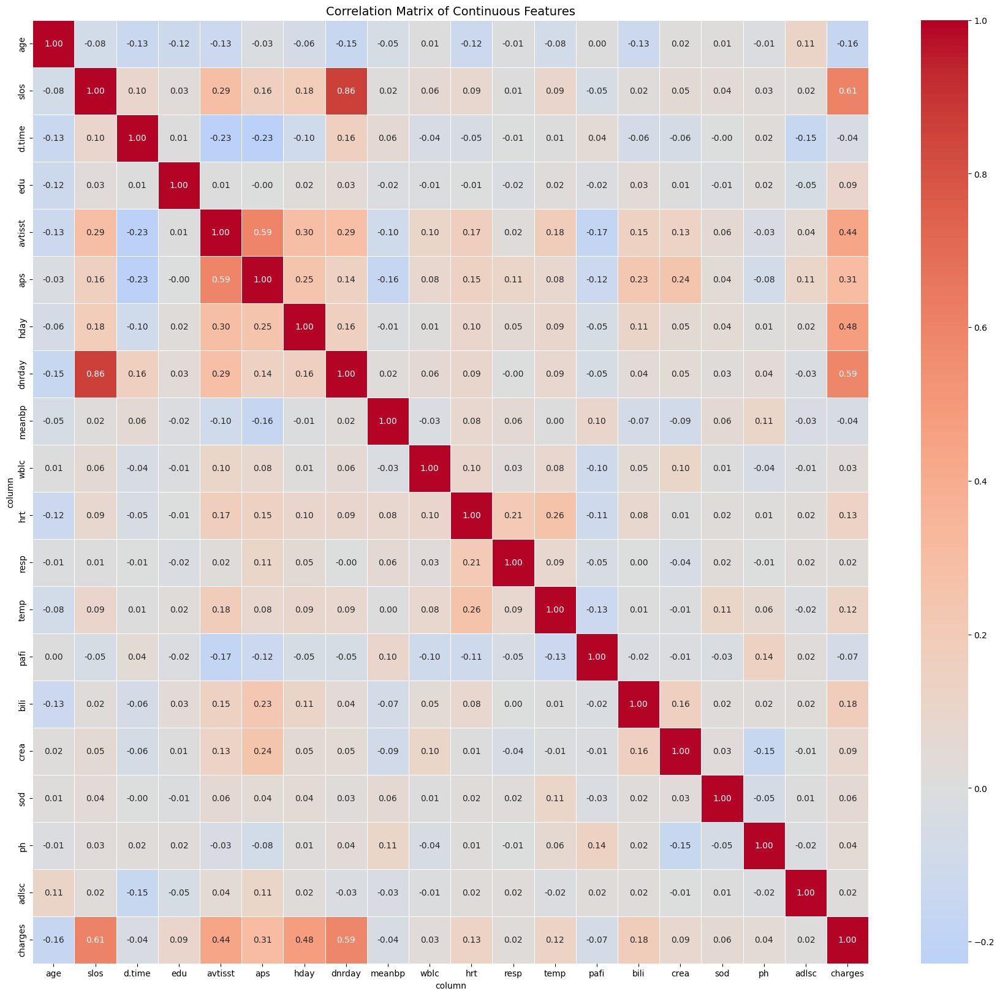

In [41]:
# compute correlation matrix for continuous features
corr = train_df[new_continuous_features].corr()

# set up the plot
plt.figure(figsize=(22,20))
sns.heatmap(
    corr,
    annot=True,        # show correlation values
    fmt=".2f",         # format with 2 decimal places
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar=True
)
plt.title("Correlation Matrix of Continuous Features", fontsize=14)
plt.show()

In [42]:
# Filtering only those columns where absolute correlation > 0.5 with Target Variable
# Adjust the threshold if no variable is selected
correlation_with_target = corr['charges']  # assuming 'charges' is the target variable
filtered_corr = correlation_with_target[abs(correlation_with_target) > 0.5]

# Display the filtered correlations
print(filtered_corr)

column
slos       0.605423
dnrday     0.588628
charges    1.000000
Name: charges, dtype: float64


**Summary**
- The heatmap shows that **slos** and **dnrday** have strong correlations with the target (above 0.5), but since these features are **also highly correlated with each other**, we selected only the one **most correlated with the target** to avoid redundancy.
- **Statistics analyze is more reliable than scatter plot.**
- Final selected continuous features : **`slos`**

---

**Remaining Features → 16**  
- **Categorical:** 15  
- **Continuous:** 1  

---

## **8.2 Relationship exploration: Categorical Vs Continuous -- Box Plots**
---

### **8.2.1. Visual exploration**
---

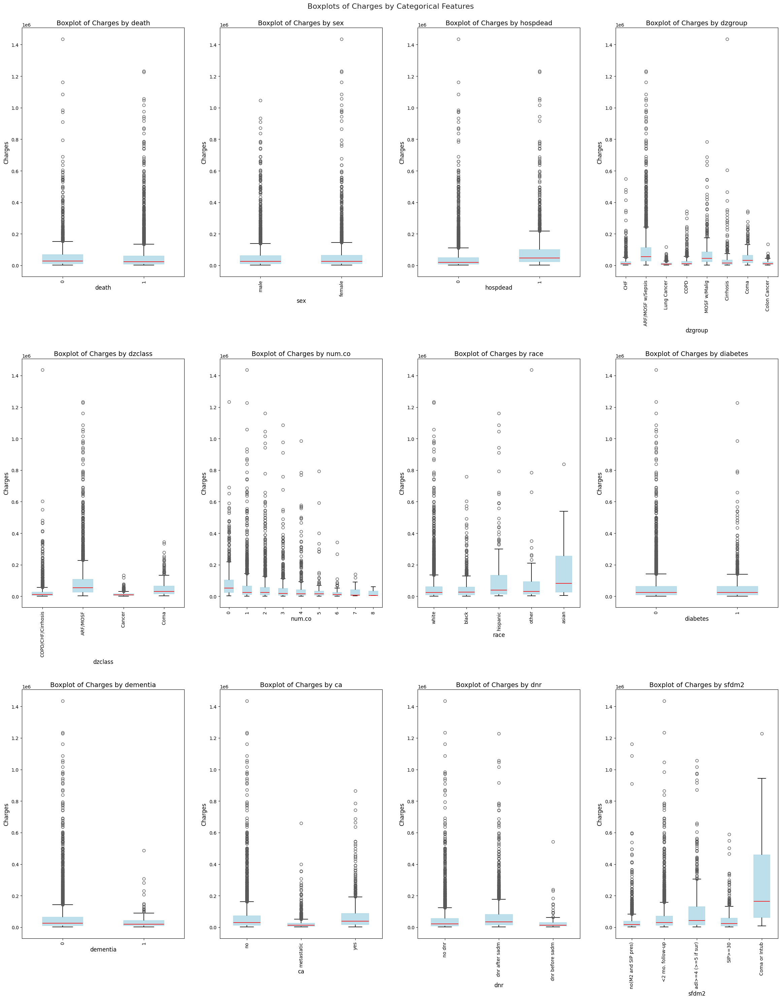

In [43]:
CategoricalColsList = [['death', 'sex', 'hospdead', 'dzgroup',
                        'dzclass', 'num.co', 'race', 'diabetes',
                        'dementia', 'ca', 'dnr', 'sfdm2']]

# Calculate number of rows and columns for a 4x4 matrix
n_cols = 4
n_rows = (len(CategoricalColsList[0]) + n_cols - 1) // n_cols  # Ensure enough rows for all plots
fig, PlotCanvas = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols * 6, n_rows * 10))
PlotCanvas = PlotCanvas.flatten()
sns.set(style="whitegrid")

# Creating box plots for each categorical feature against the Target Variable "charges"
for i, PredictorCol in enumerate(CategoricalColsList[0]):
    sns.boxplot(data=train_df, x=PredictorCol, y="charges", ax=PlotCanvas[i], palette="Set2",
                width=0.5, fliersize=6, linewidth=1.2,
                boxprops=dict(facecolor="skyblue", color="lightblue", alpha=0.8),
                medianprops=dict(color="red"),
                whiskerprops=dict(color="black"),
                capprops=dict(color="black"))

    # Set plot title and labels with adjustments
    PlotCanvas[i].set_title(f'Boxplot of Charges by {PredictorCol}', fontsize=14)
    PlotCanvas[i].set_xlabel(PredictorCol, fontsize=12)
    PlotCanvas[i].set_ylabel('Charges', fontsize=12)
    PlotCanvas[i].tick_params(axis='x', rotation=90)  # Rotate x-axis labels for readability

# Hide any empty subplots (if there are more subplots than features)
for j in range(i + 1, len(PlotCanvas)):
    PlotCanvas[j].axis('off')

# Adjust layout and spacing to fit in Colab
plt.tight_layout(pad=3.0)  # Add padding between subplots
plt.suptitle('Boxplots of Charges by Categorical Features', fontsize=16, y=1)

# Show the plot
plt.show()

**Selected Categorical Variables**

---

- **dzclass (Disease Class)**: **Selected**. The boxes are not aligned, showing **strong correlation**.

- **dzgroup (Disease Group)**: **Selected**. The boxes are not aligned, showing **strong correlation**.

- **num.co (Number of Comorbidities)**: **Selected**. The boxes are not aligned, showing **strong correlation**.

- **sfdm2 (Simplified Disease Model)**: **Selected**. The boxes are not aligned, showing **strong correlation**.

- **death**: **Selected**. The boxes are aligned, showing **weak correlation**.**Doubt**

- **hospdead (Death in Hospital)**: **Selected**. The boxes are not aligned, showing **strong correlation**.

- **ca (Cancer)**: **Selected**. The boxes are not aligned, showing a **strong correlation**.

- **race**: **Selected**. The boxes are not aligned, showing a **weak correlation**. There are slight differences in the median charges across racial groups.**Doubt**

- **dementia**: **Selected**. The boxes are mostly aligned, showing a **weak correlation**. The median charge for patients with dementia is slightly lower than for those without it.**Doubt**

- **sex**: **Selected**. The boxes are mostly aligned, showing **weak correlation**. The median charge for males and females is almost identical.**Doubt**

- **diabetes**: **Selected**. The boxes are mostly aligned, showing **weak correlation**. The median charge for patients with diabetes is slightly higher than for those without it.**Doubt**

- **dnr (DNR Order)**: **Selected**. The boxes are mostly aligned, showing **weak correlation**. The timing of a DNR order does not appear to significantly affect charges.**Doubt**
---

**Summary**

- **Strong correlations** were observed for: `dzclass`, `dzgroup`, `num.co`, `sfdm2`, `hospdead` , and `ca`.  
- **Weak correlations** were found for: `death`, `race`, `dementia`, `diabetes`, `sex`, and `dnr`.  
---



### **8.2.2 Statistical Feature Selection**
---

**ANOVA**

In [44]:
train_df['num_co_bin'] = pd.cut(train_df['num.co'], bins=[-1, 0, 1, 2, 3, 5, 10], labels=['0','1','2','3','4-5','6+'])

In [45]:
def anova_analysis(input_data, target_variable, categorical_predictors, min_group_size=2):
    selected_predictors = []

    print('------- ANOVA Results ------- \n')

    for predictor in categorical_predictors:
        data = input_data.dropna(subset=[predictor, target_variable]).copy()

        # Special handling for num.co: bin numeric values
        if predictor == 'num.co':
            # Bin num.co so that each bin has enough samples
            data[predictor] = pd.cut(data[predictor],
                                     bins=[-1,0,1,2,3,5,10],
                                     labels=['0','1','2','3','4-5','6+'])

        # Convert other numeric categorical predictors to string
        elif pd.api.types.is_numeric_dtype(data[predictor]):
            data[predictor] = data[predictor].astype(str)
        else:
            data[predictor] = data[predictor].astype(str)

        # Group target by predictor
        category_group_lists = data.groupby(predictor)[target_variable].apply(list)

        # Skip if any group has <2 samples
        if any(len(group) < min_group_size for group in category_group_lists):
            print(f"{predictor} still has a group with less than {min_group_size} samples, skipping ANOVA.")
            continue

        # Run ANOVA
        try:
            anova_results = f_oneway(*category_group_lists)
            p_value = anova_results.pvalue

            if p_value < 0.05:
                print(f"{predictor} is significantly correlated with {target_variable} | P-Value: {p_value:}")
                selected_predictors.append(predictor)
            else:
                print(f"{predictor} is NOT significantly correlated with {target_variable} | P-Value: {p_value:}")
        except Exception as e:
            print(f"Error with {predictor}: {e}")

    return selected_predictors

In [46]:
categorical_predictors = ['death', 'sex', 'hospdead', 'dzgroup', 'dzclass',
                          'num.co', 'race', 'diabetes', 'dementia',
                          'ca', 'dnr', 'sfdm2']

target_variable = 'charges'

significant_predictors = anova_analysis(train_df, target_variable, categorical_predictors)
print("\nSignificant predictors:", significant_predictors)

------- ANOVA Results ------- 

death is NOT significantly correlated with charges | P-Value: 0.19203506016982924
sex is NOT significantly correlated with charges | P-Value: 0.10518949984900497
hospdead is significantly correlated with charges | P-Value: 4.826323377083814e-47
dzgroup is significantly correlated with charges | P-Value: 1.2149452645389234e-190
dzclass is significantly correlated with charges | P-Value: 3.6309449910463153e-187
num.co is significantly correlated with charges | P-Value: 3.7595507905699144e-17
race is significantly correlated with charges | P-Value: 5.184221074987997e-35
diabetes is significantly correlated with charges | P-Value: 0.04829238856198561
dementia is significantly correlated with charges | P-Value: 0.0016906130947941566
ca is significantly correlated with charges | P-Value: 1.9538047355716303e-47
dnr is significantly correlated with charges | P-Value: 1.477883360889707e-13
sfdm2 is significantly correlated with charges | P-Value: 3.82965483412848

**Summary**
- Selected categorical features: `hospdead`, `dzgroup`, `dzclass`, `num.co`, `race`, `diabetes`, `dementia`, `ca`, `dnr`, `sfdm2`.  

**Remaining Features → 11**  
- **Categorical:** 10  
- **Continuous:** 1  

---


# **8.3 Non-linear Checking by using Mutual Information**
---

In [47]:
from sklearn.feature_selection import mutual_info_regression
import pandas as pd

# Combine one-hot encoded categorical predictors + continuous features
miX = pd.concat([
    pd.get_dummies(train_df[categorical_predictors], drop_first=True),
    train_df[new_continuous_features].drop(columns=['charges'])
], axis=1)

miy = train_df['charges']

# Compute mutual information
mi = mutual_info_regression(miX, miy, random_state=0)

# Show all results (threshold = 0)
for feature, score in sorted(zip(miX.columns, mi), key=lambda x: x[1], reverse=True):
    if score > 0:
        print(f"{feature:20s} : {score:.4f}")

slos                 : 0.4700
avtisst              : 0.4520
dnrday               : 0.3850
hday                 : 0.2357
aps                  : 0.1272
dzclass_Cancer       : 0.0819
dzclass_COPD/CHF/Cirrhosis : 0.0725
d.time               : 0.0626
dzgroup_Lung Cancer  : 0.0584
adlsc                : 0.0474
temp                 : 0.0450
pafi                 : 0.0440
resp                 : 0.0440
hospdead             : 0.0429
dzgroup_CHF          : 0.0381
hrt                  : 0.0338
sfdm2_no(M2 and SIP pres) : 0.0317
meanbp               : 0.0263
num.co               : 0.0244
age                  : 0.0195
dzgroup_Colon Cancer : 0.0176
edu                  : 0.0167
crea                 : 0.0167
wblc                 : 0.0162
ca_no                : 0.0156
dzgroup_COPD         : 0.0148
bili                 : 0.0124
dzgroup_MOSF w/Malig : 0.0119
dnr_no dnr           : 0.0113
sfdm2_adl>=4 (>=5 if sur) : 0.0108
ph                   : 0.0094
death                : 0.0084
dzclass_Coma         : 0

**Summary**

- From the MI, we can see that some features may have non-linear relationships, which will **need to be analyzed later.**
---

# **9. Selecting final predictors for machine learning summary**
---
Based on the above tests, selecting the final columns for machine learning

In [48]:
SelectedColumns=['slos', 'hospdead', 'dzgroup', 'dzclass', 'num.co', 'race', 'diabetes', 'dementia', 'ca', 'dnr', 'sfdm2']
df_ml=train_df[SelectedColumns]
df_ml.head()

column,slos,hospdead,dzgroup,dzclass,num.co,race,diabetes,dementia,ca,dnr,sfdm2
5744,8,0,CHF,COPD/CHF/Cirrhosis,2,white,0,0,no,no dnr,no(M2 and SIP pres)
7976,6,1,ARF/MOSF w/Sepsis,ARF/MOSF,1,white,0,0,no,dnr after sadm,<2 mo. follow-up
2283,21,0,ARF/MOSF w/Sepsis,ARF/MOSF,1,white,1,0,no,no dnr,no(M2 and SIP pres)
4253,10,0,Lung Cancer,Cancer,1,white,0,0,metastatic,no dnr,<2 mo. follow-up
3704,26,0,Lung Cancer,Cancer,1,white,0,0,metastatic,no dnr,adl>=4 (>=5 if sur)


# **10. Data Preprocessing for Machine Learning**
---

**Final Selected Predictors**

---

**Ordinal Features**  
- **ca** – Ordinal (no < yes < metastatic). Selected  
- **sfdm2** – Ordinal (disability scale 1–5). Selected   

---

**Binary Features**  
- **hospdead** – 0/1. Selected  
- **diabetes** – 0/1. Selected  
- **dementia** – 0/1. Selected

---

**Nominal Features**  
- **dzgroup** – Detailed disease group. Selected  
- **dzclass** – Broad disease class. Selected  
- **num.co** – Integer count. Selected  
- **race** – Nominal. Selected  
- **dnr** – Nominal. Selected  

---

**Numerical Feature**  
- **slos** – Numeric. Selected  

---


## **10.1. Converting the ordinal variable to numeric**
---

In [49]:
df_pp = train_df.copy()

In [50]:
# Example mappings (adjust based on your dataset meaning)
ca_mapping = {
    "no": 0,
    "yes": 1,
    "metastatic": 2
}

sfdm2_mapping = {
    "<2 mo. follow-up": 0,
    "no(M2 and SIP pres)": 1,
    "adl>=4 (>=5 if sur)": 2,
    "SIP>=30": 3,
    "Coma or Intub": 4
}

# apply mappings for df.train
df_pp["ca"] = df_pp["ca"].map(ca_mapping)
df_pp["sfdm2"] = df_pp["sfdm2"].map(sfdm2_mapping)

# apply mappings for X_test
X_test["ca"] = X_test["ca"].map(ca_mapping)
X_test["sfdm2"] = X_test["sfdm2"].map(sfdm2_mapping)

In [51]:
print(df_pp[["ca", "sfdm2"]].head())

column  ca  sfdm2
5744     0      1
7976     0      0
2283     0      1
4253     2      0
3704     2      2


In [52]:
print(X_test[["ca", "sfdm2"]].head())

column  ca  sfdm2
8629     0      2
1068     0      0
6548     0      3
5458     0      0
5317     2      1


**Summary**

- As we have seen, the **`ca`** and **`sfdm2`** categories were converted into numeric values (0, 1, 2, …).  
- This means we can now treat them in our analysis and modeling.

---

## **10.2. Converting the binary variable to numeric using 1/0 mapping**
---

In [53]:
# List of binary features
binary_features = ['hospdead', 'diabetes', 'dementia']
df_pp[binary_features].head()

column,hospdead,diabetes,dementia
5744,0,0,0
7976,1,0,0
2283,0,1,0
4253,0,0,0
3704,0,0,0


In [54]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in df_pp.columns:
        # If already numeric, skip
        if df_pp[col].dtype == 'object':
            # Map common binary representations to 0/1
            df_pp[col] = df_pp[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            df_pp[col] = df_pp[col].astype(int)

# Verify conversion
df_pp[binary_features].head()

column,hospdead,diabetes,dementia
5744,0,0,0
7976,1,0,0
2283,0,1,0
4253,0,0,0
3704,0,0,0


In [55]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in X_test.columns:
        # If already numeric, skip
        if X_test[col].dtype == 'object':
            # Map common binary representations to 0/1
            X_test[col] = X_test[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            X_test[col] = X_test[col].astype(int)

# Verify conversion
X_test[binary_features].head()

column,hospdead,diabetes,dementia
8629,0,0,0
1068,0,0,0
6548,0,1,0
5458,0,0,0
5317,0,0,0


**Summary**

- As we have seen, the **`hospdead`, `diabetes`** and **`dementia`** categories were converted into numeric values (0 and 1).  
- This means we can now treat them in our analysis and modeling.

---

## **10.3. Converting the nominal variable to numeric using get_dummies()**
---

In [56]:
# One-hot encode and merge into df_preprocessing
df_pp = pd.get_dummies(
    df_pp,
    columns=["dzgroup", "dzclass", "race", "dnr"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

In [57]:
df_pp.filter(regex=r'^dnr_').head()

,dnr_dnr after sadm,dnr_dnr before sadm,dnr_no dnr
5744,False,False,True
7976,True,False,False
2283,False,False,True
4253,False,False,True
3704,False,False,True


In [58]:
import re
dummy_cols = [col for col in df_pp.columns if re.match(r'^(dzgroup|dzclass|race|dnr)_', col)]

**Visualize train set of categorical features**

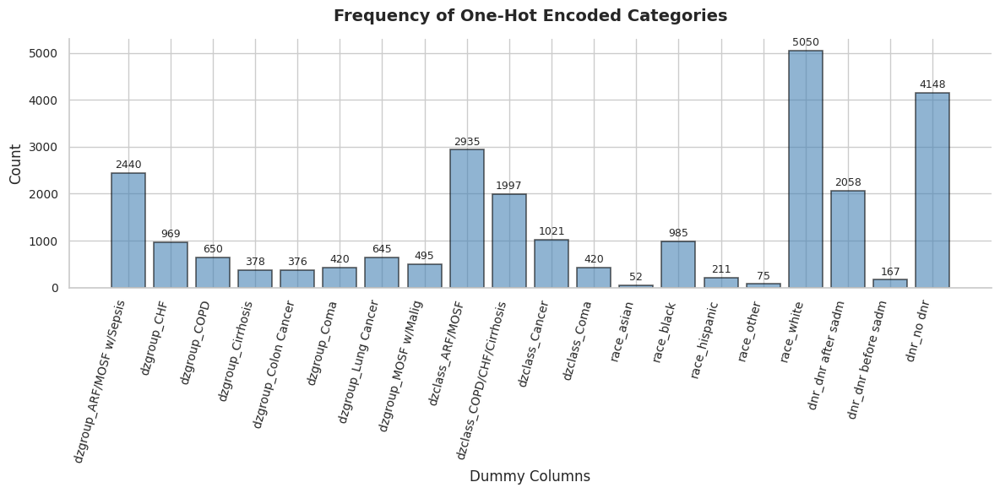

In [59]:
dummy_counts = df_pp[dummy_cols].sum()

plt.figure(figsize=(12, 6))
bars = plt.bar(
    dummy_counts.index,
    dummy_counts.values,
    color="steelblue",
    edgecolor="black",
    linewidth=1.2,
    alpha=0.6
)

plt.title("Frequency of One-Hot Encoded Categories", fontsize=14, fontweight="bold", pad=15)
plt.ylabel("Count", fontsize=12)
plt.xlabel("Dummy Columns", fontsize=12)
plt.xticks(rotation=75, ha="right", fontsize=10)
plt.yticks(fontsize=10)
sns.despine()

for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        height + max(dummy_counts.values)*0.01,
        str(int(height)),
        ha="center", va="bottom", fontsize=9
    )

plt.tight_layout()
plt.show()

**Summary**
- The graph above shows the frequency of all test categorical features and confirms that they were successfully converted into numeric values.
- From this step, all **train categorical features** are encoded in the **0–1 range**.  
---

**True = 1, False = 0 for all test categorical**

In [60]:
# One-hot encode and merge into df_preprocessing
X_test = pd.get_dummies(
    X_test,
    columns=["dzgroup", "dzclass", "race", "dnr"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

**Example of get_dummies**

In [61]:
X_test.filter(like="dzgroup").head()

,dzgroup_ARF/MOSF w/Sepsis,dzgroup_CHF,dzgroup_COPD,dzgroup_Cirrhosis,dzgroup_Colon Cancer,dzgroup_Coma,dzgroup_Lung Cancer,dzgroup_MOSF w/Malig
8629,False,False,True,False,False,False,False,False
1068,False,True,False,False,False,False,False,False
6548,True,False,False,False,False,False,False,False
5458,False,True,False,False,False,False,False,False
5317,False,False,False,False,False,False,True,False


**Visualize test set of categorical features**

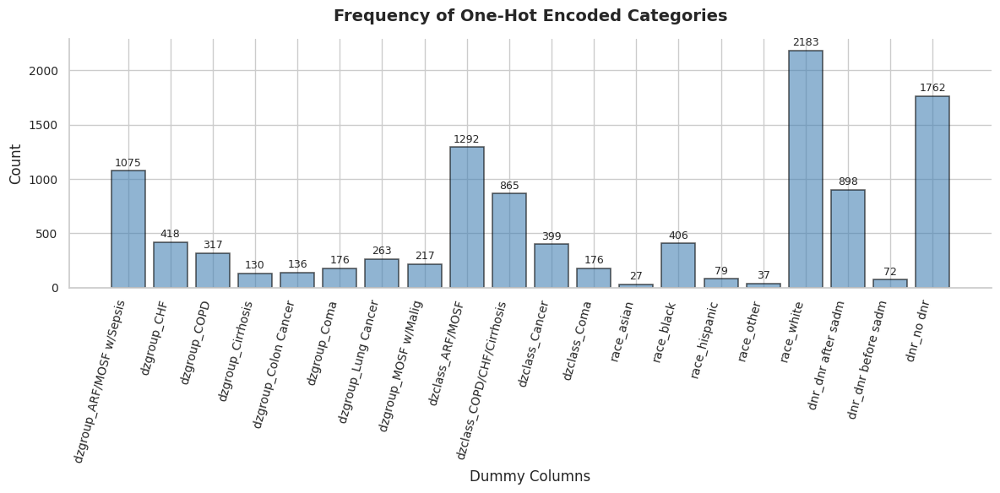

In [62]:
dummy_counts = X_test[dummy_cols].sum()

plt.figure(figsize=(12, 6))
bars = plt.bar(
    dummy_counts.index,
    dummy_counts.values,
    color="steelblue",
    edgecolor="black",
    linewidth=1.2,
    alpha=0.6
)

plt.title("Frequency of One-Hot Encoded Categories", fontsize=14, fontweight="bold", pad=15)
plt.ylabel("Count", fontsize=12)
plt.xlabel("Dummy Columns", fontsize=12)
plt.xticks(rotation=75, ha="right", fontsize=10)
plt.yticks(fontsize=10)
sns.despine()

for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        height + max(dummy_counts.values)*0.01,
        str(int(height)),
        ha="center", va="bottom", fontsize=9
    )

plt.tight_layout()
plt.show()

**Summary**

- The graph above shows the frequency of all test categorical features and confirms that they were successfully converted into numeric values.  
- From this step, all **test categorical features** are encoded in the **0–1 range**.  
- This means we **do not need to standardize or normalize** them for modeling.

---


## **10.4. Data transformation**
---

### **10.4.1. Transformation on training data**
---

**Fixing Skewness By Using Logarithm Function**

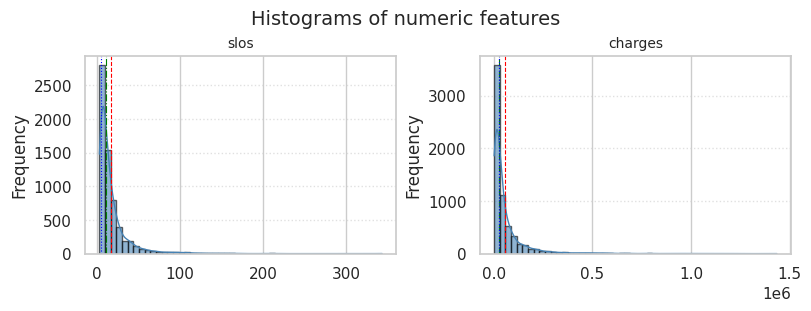

In [63]:
plot_hist_grid(df_pp, ['slos','charges'], bins=50, n_cols=2)

In [64]:
# Copy to avoid messing up the original df_clean
df_skewfix = df_pp.copy()

In [65]:
# Apply log transform
for col in []:
    # Handle potential negative values before cube root
    df_pp[col] = np.cbrt(df_pp[col].clip(lower=0))   # cube root

# Apply log transform
for col in ['slos', 'charges']:
    # Add a small constant and handle potential negative values before log
    df_pp[col] = np.log1p(df_pp[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
df_pp.replace([np.inf, -np.inf], np.nan, inplace=True)


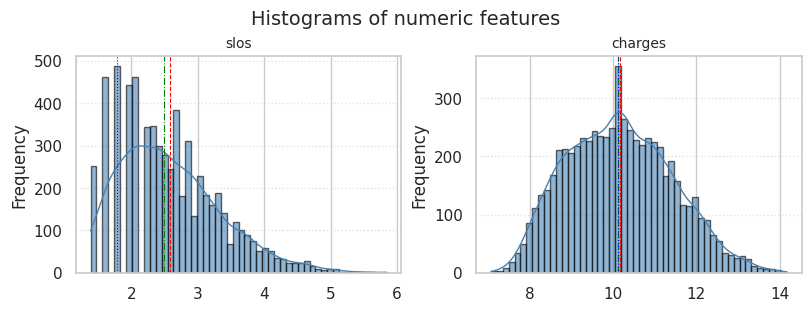

,0
slos,0
charges,0


In [66]:
# Check histograms again
plot_hist_grid(df_pp, ['slos','charges'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos','charges']
df_pp[check_cols].isnull().sum()

**Summary**

- We applied a **log transformation** to both **`slos`** and **`charges`** in order to reduce skewness and bring their distributions closer to normal.  

- The **`slos`** graph above shows the distribution after fixing skewness. However, the range is still not within **0–1**, which means it is not yet suitable for direct use.  
- To address this, we will **standardize** the feature so that it can be used properly, while also reducing the influence of extreme outliers that we decided not to remove.

---


**Standardization**

In [67]:
cols_to_standardize = ['slos']
df_std = df_pp[cols_to_standardize].copy()

In [68]:
from sklearn.preprocessing import StandardScaler

# create scaler
scaler = StandardScaler()

# fit + transform only the selected columns
df_std[cols_to_standardize] = scaler.fit_transform(df_std[cols_to_standardize])

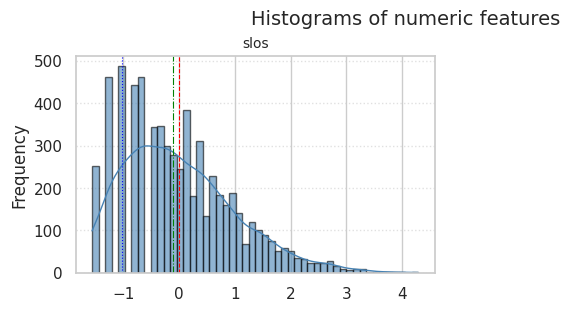

,0
slos,0


In [69]:
# Check histograms again
plot_hist_grid(df_std, ['slos'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos']
df_std[check_cols].isnull().sum()

In [70]:
print(df_std.head())
print(df_std.shape)

          slos
5744 -0.497725
7976 -0.828221
2283  0.677706
4253 -0.233829
3704  0.947025
(6373, 1)


In [71]:
df_pp[cols_to_standardize] = df_std[cols_to_standardize]

**Summary**

- The distribution of features **before and after scaling remained the same**, confirming that scaling preserved the data’s shape.
---

### **10.4.2. Transformation on testing Data**

**Fixing Skewness By Using Logarithm**

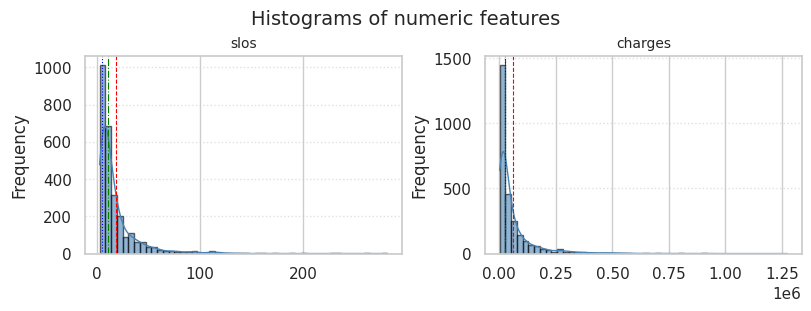

In [72]:
plot_hist_grid(test_df, ['slos','charges'], bins=50, n_cols=2)

In [73]:
dft_skewfix = test_df.copy()

In [74]:
# Apply cube root transform
for col in []:
    # Handle potential negative values before cube root
    dft_skewfix[col] = np.cbrt(dft_skewfix[col].clip(lower=0))   # cube root

# Apply log transform (add +1 to avoid log(0) errors)
for col in ['slos', 'charges']:
    # Add a small constant and handle potential negative values before log
    dft_skewfix[col] = np.log1p(dft_skewfix[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
dft_skewfix.replace([np.inf, -np.inf], np.nan, inplace=True)

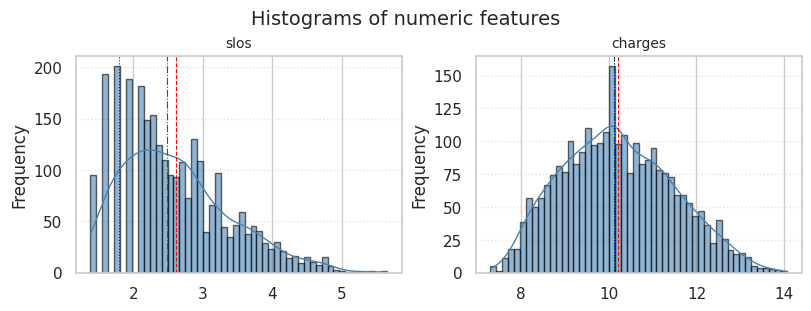

,0
column,
slos,0
charges,0


In [75]:
# Check histograms again
plot_hist_grid(dft_skewfix, ['slos','charges'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos','charges']
dft_skewfix[check_cols].isnull().sum()

In [76]:
X_test[['slos']] = dft_skewfix[['slos']]
y_test[['charges']] = dft_skewfix[['charges']]

**Summary**

- The test set **`slos`** graph above shows the distribution after fixing skewness. However, the range is still not within **0–1**, so it is not yet suitable for direct use.  
- To resolve this, we will **standardize** the feature, making it ready for modeling while also reducing the impact of extreme outliers that we chose not to remove.

**Standardization**

In [77]:
dft_std = X_test[cols_to_standardize].copy()

In [78]:
dft_std[cols_to_standardize] = scaler.transform(dft_std[cols_to_standardize])

print(dft_std.head())
print(dft_std.shape)

          slos
8629 -0.014142
1068  0.338644
6548 -0.119403
5458  0.174046
5317  0.258918
(2732, 1)


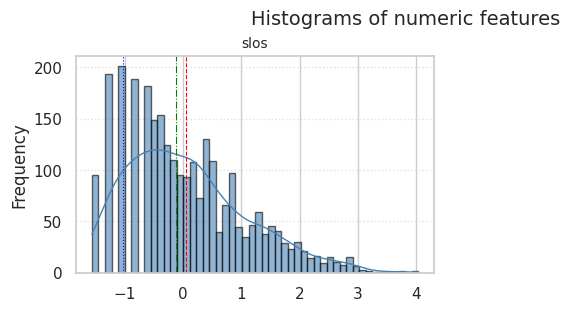

,0
slos,0


In [79]:
# Check histograms again
plot_hist_grid(dft_std, ['slos'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos']
dft_std[check_cols].isnull().sum()

In [80]:
X_test[['slos']] = dft_std[['slos']]

**Summary**

- The test set was scaled using the parameters (fit) learned from the training set.
- The distribution of features **before and after scaling remained the same**, confirming that scaling preserved the data’s shape.  
---


# **11. Model Construction (Model 1)**
---

In [81]:
RegModel = LinearRegression()
targets_vars = ['charges']

Norminal_vars = ["dzgroup", "dzclass", "race", "dnr"]

dummy_cols = [col for col in df_pp.columns if any(c in col for c in Norminal_vars)]

predictors_var = ['slos', 'hospdead',
                  'num.co', 'diabetes', 'dementia', 'ca', 'sfdm2'] + dummy_cols


X_train=df_pp[predictors_var].values
y_train=df_pp[targets_vars].values

X_test=X_test[predictors_var].values
y_test=y_test[targets_vars].values


print(RegModel)

LinearRegression()


In [82]:
LREG=RegModel.fit(X_train,y_train)

## **11.1. Training result prediction**
---

In [83]:
# Printing some sample values of prediction
print("Training result prediction")
TrainingPrediction_array = LREG.predict(X_train)
TrainingPrediction=pd.DataFrame(TrainingPrediction_array, columns=['Predictedcharges']) # Convert to DataFrame
TrainingDataResults=pd.DataFrame(data=X_train, columns=predictors_var)
TrainingDataResults['charges']=y_train
TrainingDataResults['Predictedcharges']=TrainingPrediction['Predictedcharges'] # Assign from the DataFrame

# Printing sample prediction values
print(TrainingDataResults.head())

Training result prediction
       slos hospdead num.co diabetes dementia ca sfdm2 dnrday  \
0 -0.497725        0      2        0        0  0     1    8.0   
1 -0.828221        1      1        0        0  0     0    3.0   
2  0.677706        0      1        1        0  0     1   21.0   
3 -0.233829        0      1        0        0  2     0   10.0   
4  0.947025        0      1        0        0  2     2   26.0   

  dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF  ... race_asian race_black  \
0                     False        True  ...      False      False   
1                      True       False  ...      False      False   
2                      True       False  ...      False      False   
3                     False       False  ...      False      False   
4                     False       False  ...      False      False   

  race_hispanic race_other race_white dnr_dnr after sadm dnr_dnr before sadm  \
0         False      False       True              False               False   
1

**Example charges values from prediction and inverse logarithm**

In [84]:
TrainingDataResults['charges'] = np.expm1(TrainingDataResults['charges'])
TrainingDataResults['Predictedcharges'] = np.expm1(TrainingDataResults['Predictedcharges'])

print(TrainingDataResults[['charges', 'Predictedcharges']].head())

     charges  Predictedcharges
0  12499.000      10988.789212
1   5435.000      32030.603821
2  54833.000      53689.642504
3   6285.047      11800.733937
4  20963.141      26964.906331


**Coefficient, Intercept and number of features**

In [85]:
LREG.coef_

array([[ 0.77716938,  0.67594925, -0.00573335, -0.08066883, -0.29663227,
        -0.0812911 , -0.05353839,  0.00097998,  0.13040586, -0.08965389,
        -0.09310585, -0.02124296, -0.02765894,  0.06999506, -0.14922945,
         0.18049017,  0.31089603, -0.2040027 , -0.17688839,  0.06999506,
         0.65082134, -0.3916588 ,  0.0505343 ,  0.0172721 , -0.32696895,
         0.00443161, -0.14753525,  0.14310364]])

In [86]:
LREG.intercept_

array([10.22622561])

In [87]:
LREG.n_features_in_

28

## **11.2. Testing result prediction**
---

In [88]:
# Printing some sample values of prediction
print("Testing result prediction")
TestingPrediction=LREG.predict(X_test)
TestingDataResults=pd.DataFrame(data=X_test, columns=predictors_var)
TestingDataResults['charges']=y_test
TestingDataResults[('Predicted'+'charges')]=np.array(TestingPrediction)

# Printing sample prediction values
print(TestingDataResults.head())

Testing result prediction
       slos hospdead num.co diabetes dementia ca sfdm2 dnrday  \
0 -0.014142        0      3        0        0  0     2    5.0   
1  0.338644        0      2        0        0  0     0   16.0   
2 -0.119403        0      4        1        0  0     3   11.0   
3  0.174046        0      2        0        0  0     0   14.0   
4  0.258918        0      1        0        0  2     1   15.0   

  dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF  ... race_asian race_black  \
0                     False       False  ...      False      False   
1                     False        True  ...      False      False   
2                      True       False  ...      False      False   
3                     False        True  ...      False      False   
4                     False       False  ...      False      False   

  race_hispanic race_other race_white dnr_dnr after sadm dnr_dnr before sadm  \
0         False      False       True               True               False   
1 

**Example charges values from prediction and inverse logarithm**

In [89]:
TestingDataResults['charges'] = np.expm1(TestingDataResults['charges'])
TestingDataResults['Predictedcharges'] = np.expm1(TestingDataResults['Predictedcharges'])

print(TestingDataResults[['charges', 'Predictedcharges'
                           ]].head())

   charges  Predictedcharges
0   8417.0      13044.678625
1  71501.0      22382.966634
2  18040.0      25270.382649
3  20779.0      19656.606819
4  11291.0      16485.736642


## **11.3. R-squared of training vs testing**
---

In [90]:
from sklearn import metrics
# Measuring Goodness of fit in data by R square
print('R2 Value of training set:',metrics.r2_score(y_train, LREG.predict(X_train)))
print('R2 Value of testing set:',metrics.r2_score(y_test, LREG.predict(X_test))) # Fixed: Removed [predictors_var]

R2 Value of training set: 0.7197875472016834
R2 Value of testing set: 0.7208660126497506


## **11.4. Measuring goodness of fit in training data**
---

### **11.4.1. MAPE, RMSE and MAE of training**
---

In [91]:
#Measuring Goodness of fit in data by MAPE
TrainingDataResults['APE']=100 * ((abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))/TrainingDataResults['charges'])
MAPE_training=np.mean(TrainingDataResults['APE'])
RMSE_training = np.sqrt(np.mean((TrainingDataResults['charges']-TrainingDataResults['Predictedcharges'])**2))
MAE_training = np.mean(abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))

In [92]:
print('MAPE on training data:', MAPE_training)
print('RMSE on training data:', RMSE_training)
print('MAE on training data:', MAE_training)
print('% difference between MAE and RMSE',(RMSE_training-MAE_training)*100/MAE_training)
print('Accuracy on training data:', 100-MAPE_training)

MAPE on training data: 58.08562611011112
RMSE on training data: 76901.8705147409
MAE on training data: 30570.873597216716
% difference between MAE and RMSE 151.55274110891725
Accuracy on training data: 41.91437388988888


### **11.4.2. Visualize of Actual vs Predicted on training**
---

<Axes: title={'center': 'Model 1 Actual vs Predected on training'}>

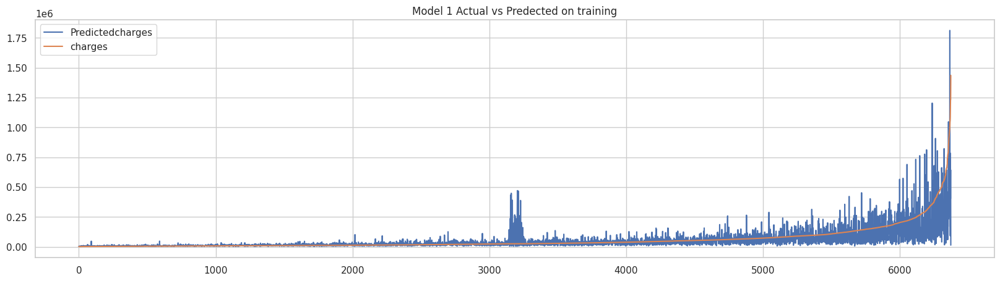

In [93]:
(TrainingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Model 1 Actual vs Predected on training")

<Axes: title={'center': 'Residual on training'}>

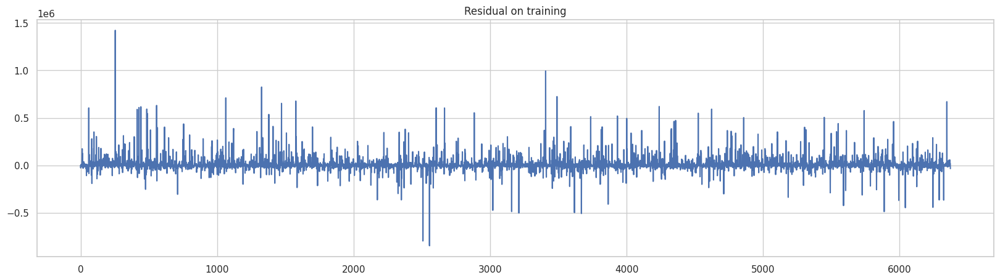

In [94]:
(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']).plot(kind="line",figsize = (20,5),title="Residual on training")

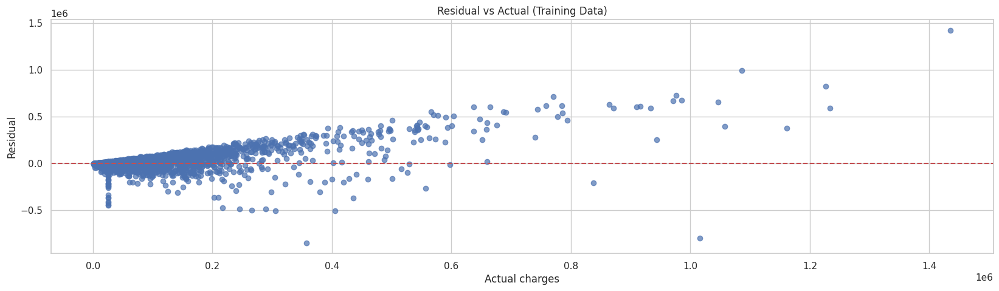

In [95]:
Training_residual = TrainingDataResults['charges'] - TrainingDataResults['Predictedcharges']

plt.figure(figsize=(20, 5))
plt.scatter(TrainingDataResults['charges'], Training_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residual vs Actual (Training Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()

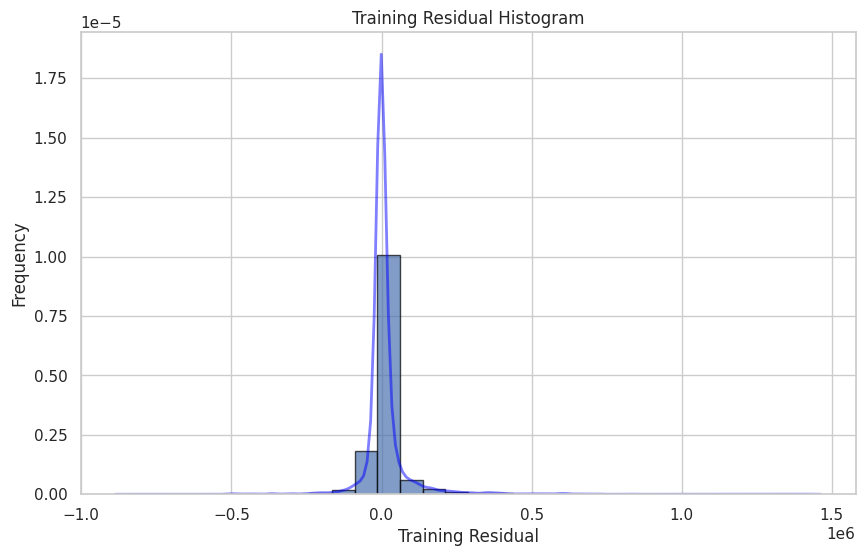

In [96]:
plt.figure(figsize=(10, 6))
plt.hist(Training_residual, bins=30, edgecolor='black', alpha=0.7, density=True)
sns.kdeplot(Training_residual, color='blue', linewidth=2, alpha=0.5)
plt.title('Training Residual Histogram')
plt.xlabel('Training Residual')
plt.ylabel('Frequency')
plt.show()

In [97]:
Training_residual.describe()

,0
count,6.373000e+03
mean,9.855130e+03
std,7.627376e+04
min,-8.456012e+05
25%,-7.231042e+03
50%,-8.152486e+02
75%,1.133960e+04
max,1.421824e+06


In [98]:
Training_residual.median()

-815.2486393851909

## **11.5. Measuring goodness of fit in testing data**
---

### **11.5.1. MAPE, RMSE and MAE of testing**
---

In [99]:
TestingDataResults['APE']=100 * ((abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))/TestingDataResults['charges'])
MAPE_testing = np.mean(TestingDataResults['APE'])
RMSE_testing = np.sqrt(np.mean((TestingDataResults['charges']-TestingDataResults['Predictedcharges'])**2))
MAE_testing = np.mean(abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))

In [100]:
print('MAPE on test data:', MAPE_testing)
print('RMSE on test data:', RMSE_testing)
print('MAE on test data:', MAE_testing)
print('% difference between MAE and RMSE',(RMSE_testing-MAE_testing)*100/MAE_testing)
print('Accuracy on test data:', 100-MAPE_testing)

MAPE on test data: 58.96002102799955
RMSE on test data: 78811.02353085963
MAE on test data: 32839.068418914474
% difference between MAE and RMSE 139.99165422569197
Accuracy on test data: 41.03997897200045


### **11.5.2. Visualize of Actual vs Predicted on testing**
---

<Axes: title={'center': 'Model 1 Actual vs Predected on testing'}>

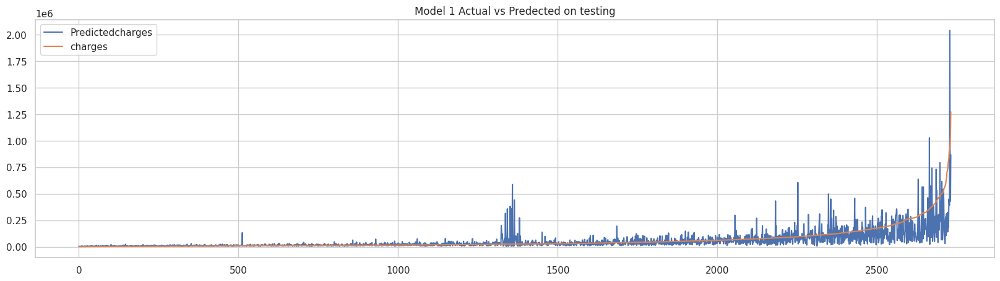

In [101]:
(TestingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Model 1 Actual vs Predected on testing")

<Axes: title={'center': 'Residual on testing'}>

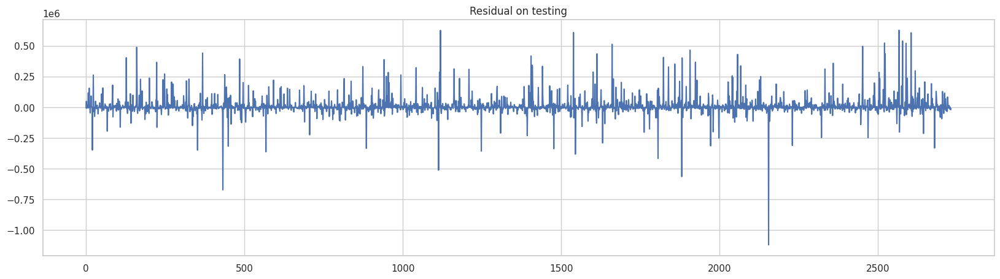

In [102]:
(TestingDataResults['charges']-TestingDataResults['Predictedcharges']).plot(kind="line",figsize = (20,5),title="Residual on testing")

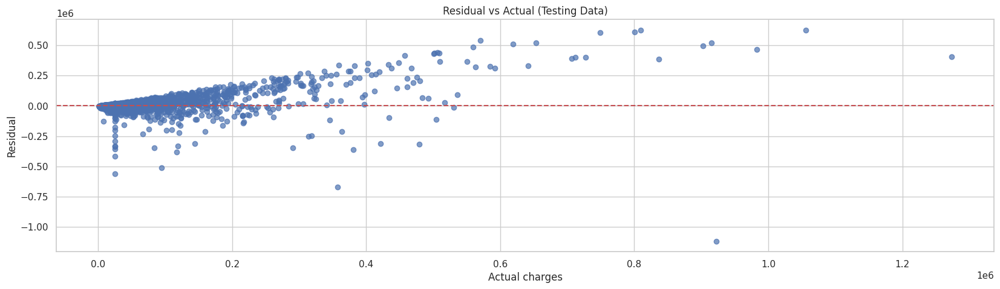

In [103]:
Testing_residual = TestingDataResults['charges'] - TestingDataResults['Predictedcharges']
plt.figure(figsize=(20, 5))
plt.scatter(TestingDataResults['charges'], Testing_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residual vs Actual (Testing Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()

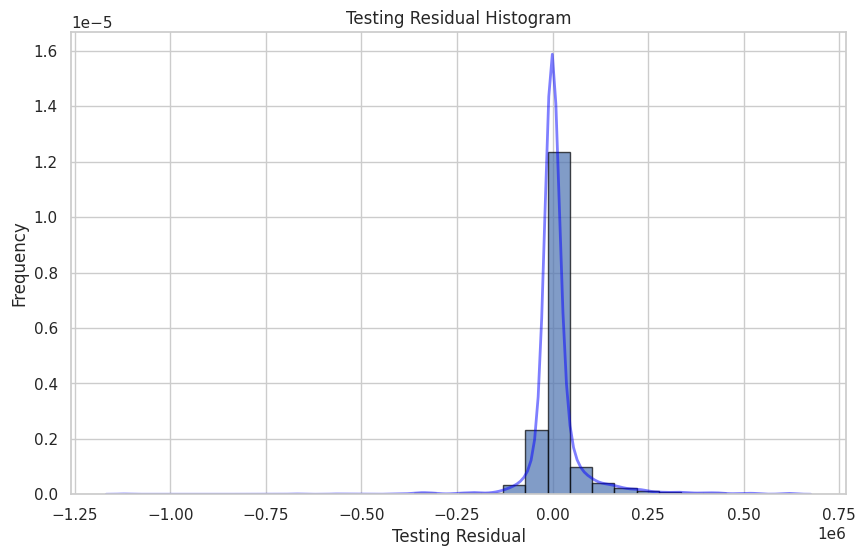

In [104]:
plt.figure(figsize=(10, 6))
plt.hist(Testing_residual, bins=30, edgecolor='black', alpha=0.7, density=True)
sns.kdeplot(Testing_residual, color='blue', linewidth=2, alpha=0.5)
plt.title('Testing Residual Histogram')
plt.xlabel('Testing Residual')
plt.ylabel('Frequency')
plt.show()

In [105]:
Testing_residual.describe()

,0
count,2.732000e+03
mean,9.771098e+03
std,7.821728e+04
min,-1.119171e+06
25%,-7.584938e+03
50%,-7.897348e+02
75%,1.276495e+04
max,6.272045e+05


In [106]:
Testing_residual.median()

-789.7347590161562

---
# **Model 1 and 2 Comparison Experimental**

---

## **Why we need to build model 2?**

---

- Model 1 showed **poor predictive performance** with **large residuals** and **low accuracy**, which indicates the model **underfit the data** and was strongly affected by **extreme outliers**. To overcome this limitation, I designed **Model 2**, introducing **outlier removal** in the preprocessing pipeline while keeping other settings consistent.

- This adjustment aimed to reduce the influence of extreme values, improve error metrics, enhance the model’s ability to generalize and **analyze the model with cost function and r-squared analysis.**

- The performance of **Model 2** is analyzed in **Section 13**, where we evaluate how outlier treatment impacts prediction quality compared to the baseline (Model 1).  

---


# **12. Linear regression model with outlier treatment (Model 2)**
---
Now, we aim to build a machine learning model that can predict the **charges** (price) of **normal hospitalized patients**.

Here, **"normal patients"** refers to those whose records do **not contain extreme outlier values**. Outliers (e.g., extremely high or clinically rare cases) are excluded, since they can distort model training and reduce prediction accuracy. These outliers were identified and cut using statistical methods (e.g., histogram/boxplot inspection or thresholding).  

- **Target Variable:** `charges`  
- **Predictors:** `age`, `slos`, `sex`, `d.time`, `meanbp`, `adlp`, etc.  
- **Samples:** Medical records of **9,105 hospitalized patients** from five U.S. states, spanning **1989–1991** and **1992–1994**.

---

## **Determining the Type of Machine Learning**

Since the target variable (`charges`) is **continuous**, we will use a:  
**Supervised Machine Learning Regression Model**

---

## **12.1. Outlier Treatment**
---

In [107]:
support2 = fetch_ucirepo(id=880)  # SUPPORT2 Dataset
df = pd.concat([support2.data.original], axis=1)

In [108]:
df_outlier = df.copy()
df_outlier.shape

(9105, 48)

In [109]:
# Continuous variables
continuous_vars_for_outlier = [
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc' ,'charges'
]

# Categorical variables
categorical_vars_for_outlier = [
    'death', 'sex', 'hospdead', 'dzgroup', 'dzclass', 'num.co',
    'income', 'race', 'diabetes', 'dementia', 'ca',
    'dnr', 'adlp', 'adls', 'sfdm2'
]

In [110]:
def remove_outliers_iqr(df_outlier, cols, whisker=1.5):
    """
    Remove rows where any value in cols lies outside IQR range [Q1 - whisker*IQR, Q3 + whisker*IQR].
    """
    mask = np.ones(len(df), dtype=bool)
    for col in cols:
        Q1 = df_outlier[col].quantile(0.25)
        Q3 = df_outlier[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - whisker * IQR
        upper = Q3 + whisker * IQR
        mask &= (df_outlier[col] >= lower) & (df_outlier[col] <= upper)
    return df.loc[mask].copy()

In [111]:
def remove_outliers_zscore(df_outlier, cols, z_max=3.0):
    """
    Remove rows where any value in cols has |z-score| > z_max.
    """
    mask = np.ones(len(df_outlier), dtype=bool)
    for col in cols:
        mu = df_outlier[col].mean()
        sd = df_outlier[col].std(ddof=0)
        z = (df_outlier[col] - mu) / (sd if sd > 0 else 1e-8)
        mask &= (z.abs() <= z_max)
    return df_outlier.loc[mask].copy()

In [112]:
def remove_rare_categorical(df_outlier, cols, min_percent=0.01):
    n = len(df_outlier)

    for col in cols:
        freqs = df_outlier[col].value_counts(normalize=True)
        rare_cats = freqs[freqs < min_percent].index
        df_outlier = df_outlier[~df_outlier[col].isin(rare_cats)]

    return df_outlier

In [113]:
df_outlier = remove_outliers_iqr(df_outlier, continuous_vars_for_outlier, whisker=1.5)
print("Shape after IQR removal:", df_outlier.shape)

Shape after IQR removal: (611, 48)


In [114]:
df_outlier = remove_outliers_zscore(df_outlier, continuous_vars_for_outlier, z_max=3.0)
print("Shape after Z-score removal:", df_outlier.shape)

Shape after Z-score removal: (525, 48)


In [115]:
df_cat_clean = remove_rare_categorical(df_outlier, categorical_vars_for_outlier, min_percent=0.01)
print("Shape after Rare catgories removal:",df_outlier.shape)

Shape after Rare catgories removal: (525, 48)


In [116]:
leak_col = ['totcst', 'totmcst', 'sps', 'surv2m', 'surv6m', 'prg2m', 'prg6m']
df_outlier = df_outlier.drop(columns=leak_col)
print(df_outlier.shape)

(525, 41)


**Summary**  

- We removed **continuous outliers** using both the **IQR method** and the **Z-score method** (tested separately).  
- For **categorical outliers**, we **removed rows containing rare categories** (those that appear in only a small percentage of the data).
---


## **12.2. Missing Value treatment**
---

### **12.2.1. Missing Values Treatment for Continuous Features**
---

#### **12.2.1.1. Check the missing values**

---

- Remove values with more than 30% missing
---

In [117]:
df_clean_2 = df_outlier.copy()
df_clean_2.shape

(525, 41)

In [118]:
continuous_features = [
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc' ,'charges'
]

missing = df_clean_2[continuous_features].isnull().sum()
missing_percent = (missing / len(df_clean_2)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]
print(f"Numerical Features ({len(continuous_features)}): {continuous_features}")

         Missing Values  Percentage
age                   0         0.0
slos                  0         0.0
d.time                0         0.0
edu                   0         0.0
avtisst               0         0.0
aps                   0         0.0
hday                  0         0.0
dnrday                0         0.0
meanbp                0         0.0
wblc                  0         0.0
hrt                   0         0.0
resp                  0         0.0
temp                  0         0.0
pafi                  0         0.0
alb                   0         0.0
bili                  0         0.0
crea                  0         0.0
sod                   0         0.0
ph                    0         0.0
glucose               0         0.0
bun                   0         0.0
urine                 0         0.0
adlsc                 0         0.0
charges               0         0.0
Numerical Features (24): ['age', 'slos', 'd.time', 'edu', 'avtisst', 'aps', 'hday', 'dnrday', 'meanb

**Summary**  
- After applying outlier treatment, all **continuous features** now have **0 missing values**.
- No missing values left in continuous features
---

### **12.2.2. Missing Values Treatment for Categorical Features**
---

#### **12.2.2.1. Check the missing values**

---

- Remove values with more than 30% missing
---

In [119]:
categorical_features = ['death', 'sex', 'hospdead', 'dzgroup',
          'dzclass', 'num.co', 'income',
          'race', 'diabetes', 'dementia', 'ca',
          'dnr', 'adlp', 'adls', 'sfdm2'],

missing = df_clean_2[categorical_features[0]].isnull().sum()
missing_percent = (missing / len(df_clean_2)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
adlp                 224       42.67
adls                 115       21.90
income               103       19.62
sfdm2                 50        9.52
hospdead               0        0.00
sex                    0        0.00
death                  0        0.00
num.co                 0        0.00
dzclass                0        0.00
dzgroup                0        0.00
race                   0        0.00
ca                     0        0.00
dementia               0        0.00
diabetes               0        0.00
dnr                    0        0.00


In [120]:
# features to drop if more than 30% missing
to_drop_cat = missing_table[missing_table['Percentage'] > 30].index.tolist()

# drop them from df_clean
df_clean_2 = df_clean_2.drop(columns=to_drop_cat)

print("Dropped categorical features:", to_drop_cat)
print("New shape:", df_clean_2.shape)

Dropped categorical features: ['adlp']
New shape: (525, 40)


In [121]:
categorical_features = ['death', 'sex', 'hospdead', 'dzgroup',
          'dzclass', 'num.co', 'income',
          'race', 'diabetes', 'dementia', 'ca',
          'dnr', 'adls', 'sfdm2'],

#### **12.2.2.2. Filling the missing values**

- Impute the missing values with **MODE** value for categorical variables

In [122]:
mode_features = ['sfdm2','income','adls']
mode_dict = {col: df_clean_2[col].mode()[0] for col in mode_features}
df_clean_2[mode_features] = df_clean_2[mode_features].fillna(mode_dict)

In [123]:
df_clean_2 = df_clean_2.drop(columns=df_clean_2.columns[0])
num_missing_cols = (df_clean_2.isnull().sum() > 0).sum()

print("Number of features with missing values:", num_missing_cols)
print("New shape:", df_clean_2.shape)

Number of features with missing values: 0
New shape: (525, 39)


In [124]:
missing = df_clean_2[categorical_features[0]].isnull().sum()
missing_percent = (missing / len(df_clean_2)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
death                  0         0.0
sex                    0         0.0
hospdead               0         0.0
dzgroup                0         0.0
dzclass                0         0.0
num.co                 0         0.0
income                 0         0.0
race                   0         0.0
diabetes               0         0.0
dementia               0         0.0
ca                     0         0.0
dnr                    0         0.0
adls                   0         0.0
sfdm2                  0         0.0


**Summary**
- No missing values left in continuous features
---

### **12.2.3. Visualization of Histograms and Boxplots After Missing Value Treatment**

---

- Visualization with histograms and boxplots after missing value treatment helps confirm whether the imputation preserved the data’s distribution, spread, and outliers without introducing distortions.

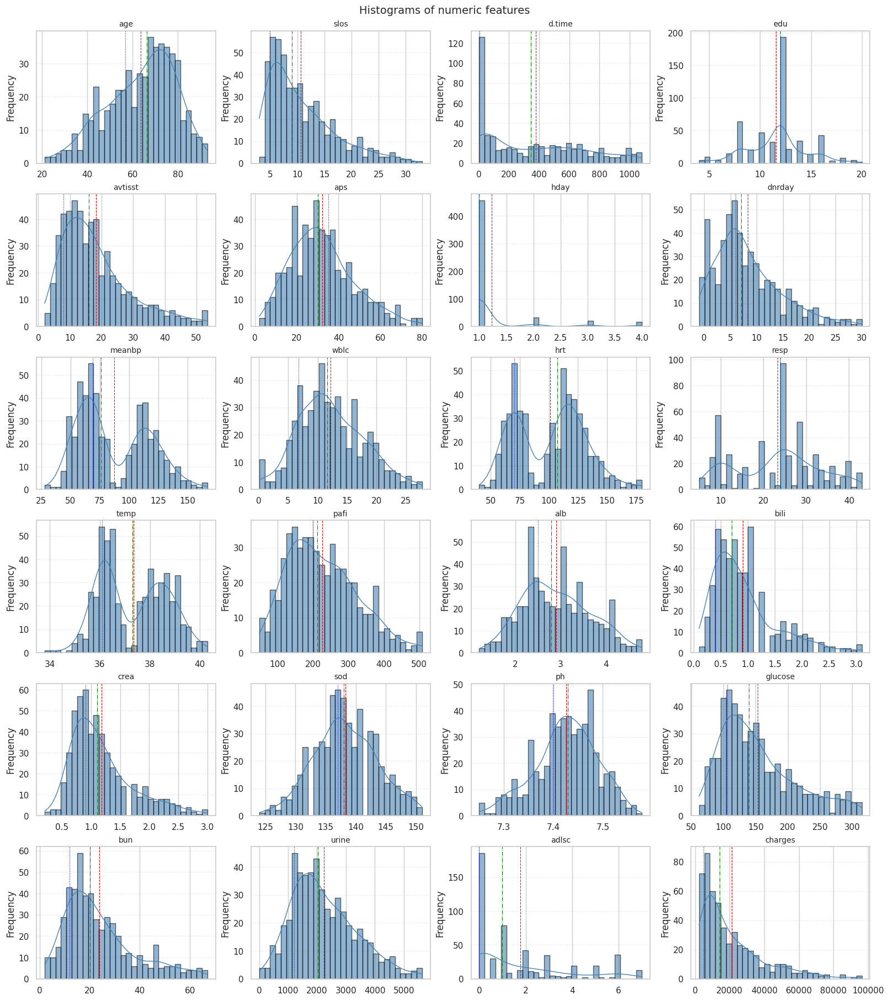

In [125]:
plot_hist_grid(df_clean_2, continuous_features, bins=30, n_cols=4)

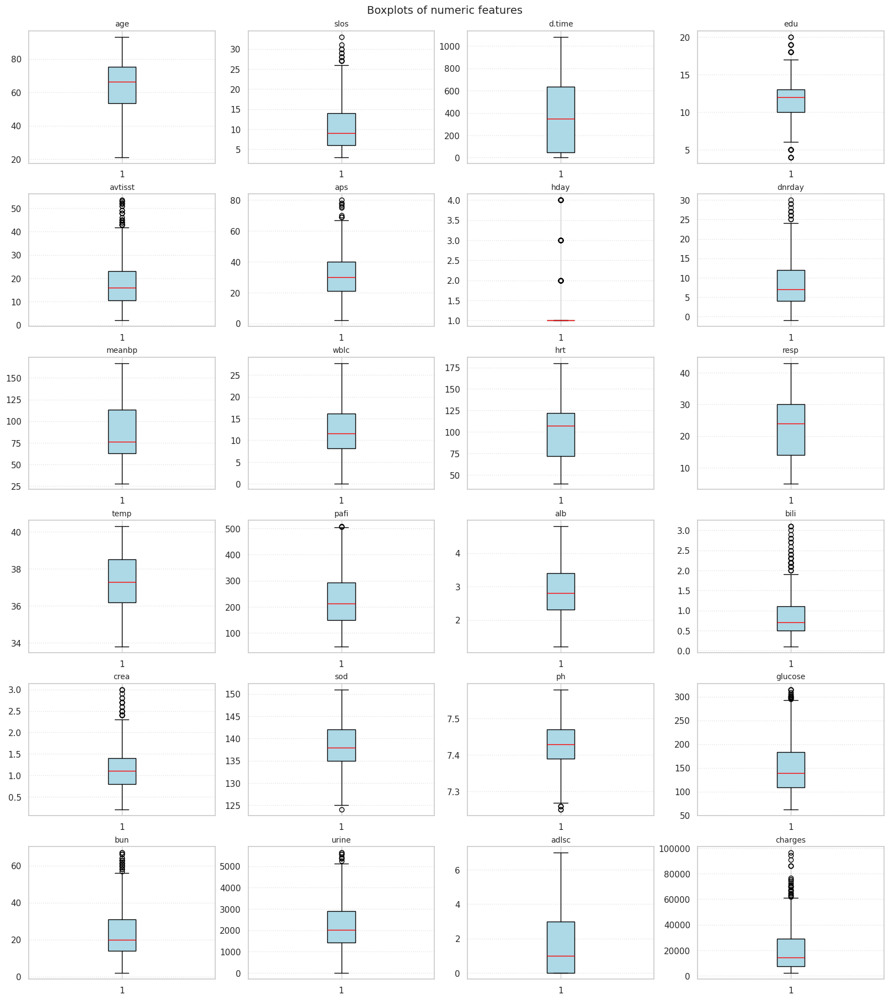

In [126]:
plot_box_grid(df_clean_2, continuous_features, n_cols=4)

**Summary**
- Extreme outliers have already been removed using IQR/Z-score criteria. **The black dots that still appear are just values beyond 1.5×IQR (Minimum and maximum)** according to the boxplot definition, not unremoved outliers.
---

### **12.2.4. Training and Testing sample**
---

#### **12.2.4.1. Splitting the Data**
70% of data is used as Training data and the rest 30% is used as Tesing data.

In [127]:
target_variables =  ['charges']
predictor_variables=[
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc' ,'charges','death', 'sex', 'hospdead',
    'dzgroup','dzclass', 'num.co', 'income',
    'race', 'diabetes', 'dementia',
    'ca','dnr', 'adls', 'sfdm2']

In [128]:
X = df_clean_2[predictor_variables]
y = df_clean_2[target_variables]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#### **12.2.4.2. Visualization of training and testing data**
- To confirm they follow similar distributions, ensuring the split was fair and that the model will be tested on data representative of what it learned during training.

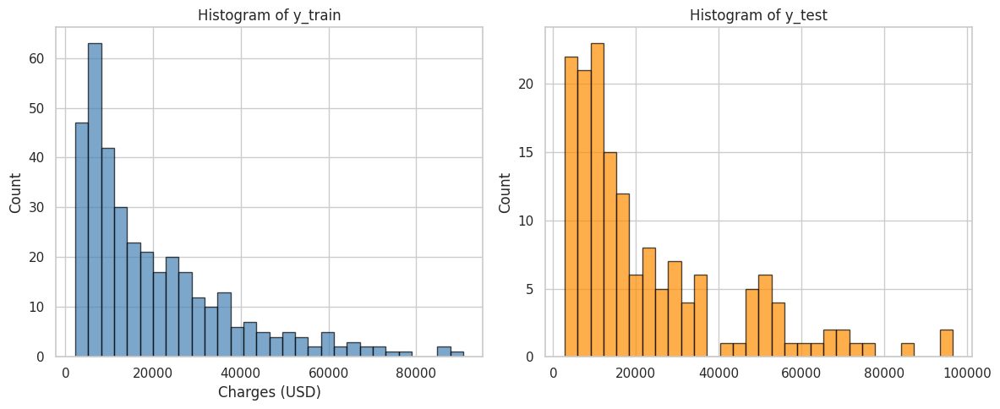

In [129]:
import matplotlib.pyplot as plt

# Plot histograms for y_train and y_test
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(y_train, bins=30, color="steelblue", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_train")
plt.xlabel("Charges (USD)")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.hist(y_test, bins=30, color="darkorange", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_test")
plt.ylabel("Charges (USD)")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

In [130]:
train_df = X_train.copy()
train_df["charges"] = y_train

test_df = X_test.copy()
test_df["charges"] = y_test

print(train_df.shape)
print(test_df.shape)

(367, 38)
(158, 38)


**Summary**

- The visualization of training and testing data shows **similar distributions**, confirming that the split is balanced and representative of the overall dataset.  
- The training set contains **367 instances**.  
- The testing set contains **158 instances**.  
---

## **12.3. Feature selection by Visual correlation analysis and Statistical measurement**
---

In this case study the Target variable is Continuous, hence below two scenarios will be present

* Continuous Target Variable Vs Continuous Predictor
* Continuous Target Variable Vs Categorical Predictor
---

### **12.3.1. Relationship exploration: Continuous Vs Continuous -- Scatter Charts**
---

#### **12.3.1.1. Visual exploration**
---

In [131]:
def plot_scatter_grid(train_df, x_cols, y_col, n_cols=3):
    n = len(x_cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(5*n_cols, 4*n_rows),
                             constrained_layout=True)
    axes = axes.flatten()

    for i, col in enumerate(x_cols):
        axes[i].scatter(train_df[col], train_df[y_col], alpha=0.5,
                        color="steelblue", edgecolor="black")
        axes[i].set_title(f"{col} vs {y_col}", fontsize=9)
        axes[i].set_xlabel(col)
        axes[i].set_ylabel(y_col)
        axes[i].grid(linestyle=":", alpha=0.6)

    # hide any unused subplots
    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle(f"Scatter plots vs {y_col}", fontsize=14)
    plt.show()

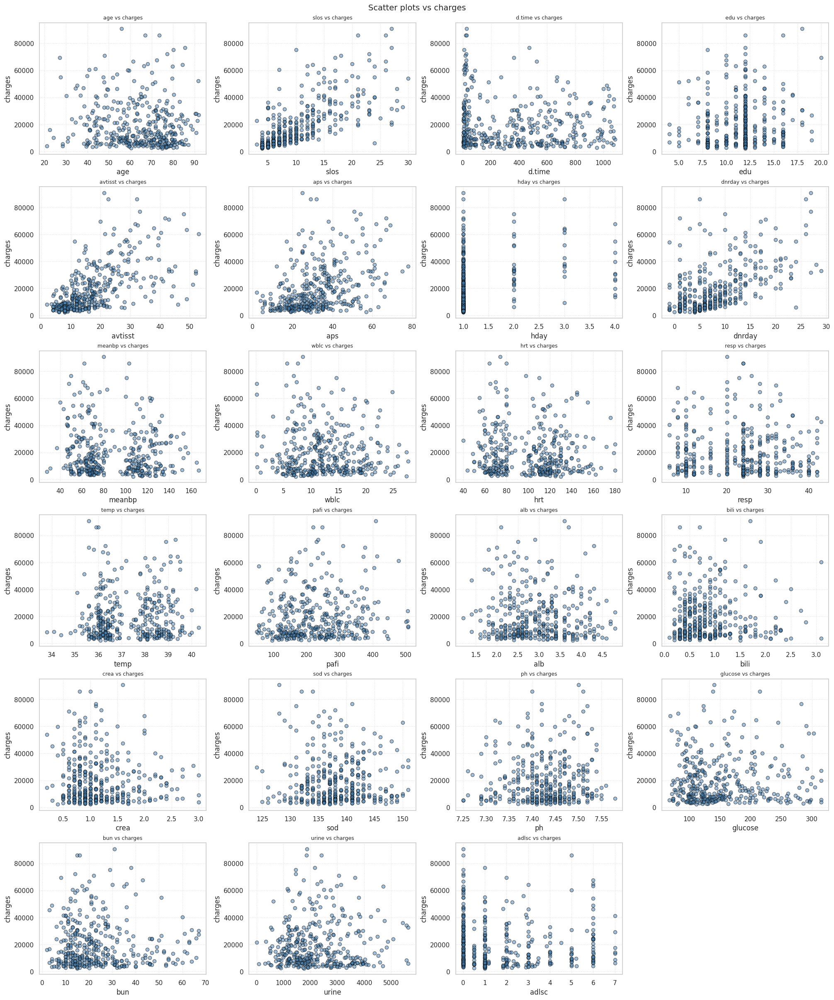

In [132]:
plot_scatter_grid(train_df, x_cols=[
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc'
    ]
    ,y_col='charges', n_cols=4)

**Scatter Charts Interpretation**

---

* **age:** Selected. No trend.  
* **slos:** Selected. Strongly increasing trend.  
* **d.time:** Selected. No trend.   
* **edu:** Selected. No trend.
* **avtisst:** Selected. Strongly increasing trend.
* **aps:** Selected. No trend.
* **hday:** Selected. No trend.
* **dnrday:** Selected. Strongly increasing trend.
* **meanbp:** Selected. No trend.  
* **wblc:** Selected. No trend.  
* **hrt:** Selected. No trend.  
* **resp:** Selected. No trend.  
* **temp:** Selected. No trend.  
* **pafi:** Selected. No trend.
* **alb:** Selected. No trend.
* **bili:** Selected. No trend.   
* **crea:** Selected. No trend.   
* **sod:** Selected. No trend.  
* **ph:** Selected. No trend.  
* **glucose:** Selected. No trend.  
* **bun:** Selected. No trend.   
* **urine:** Selected. No trend.  
* **adlsc:** Selected. No trend.  

---

**Summary**

- **Strong correlations** :  `slos`, `avtisst` and `dnrday`
- **Weak correlations** :  -
- **No correlations** : others
---

#### **12.3.1.2. Statistical Feature Selection**
---

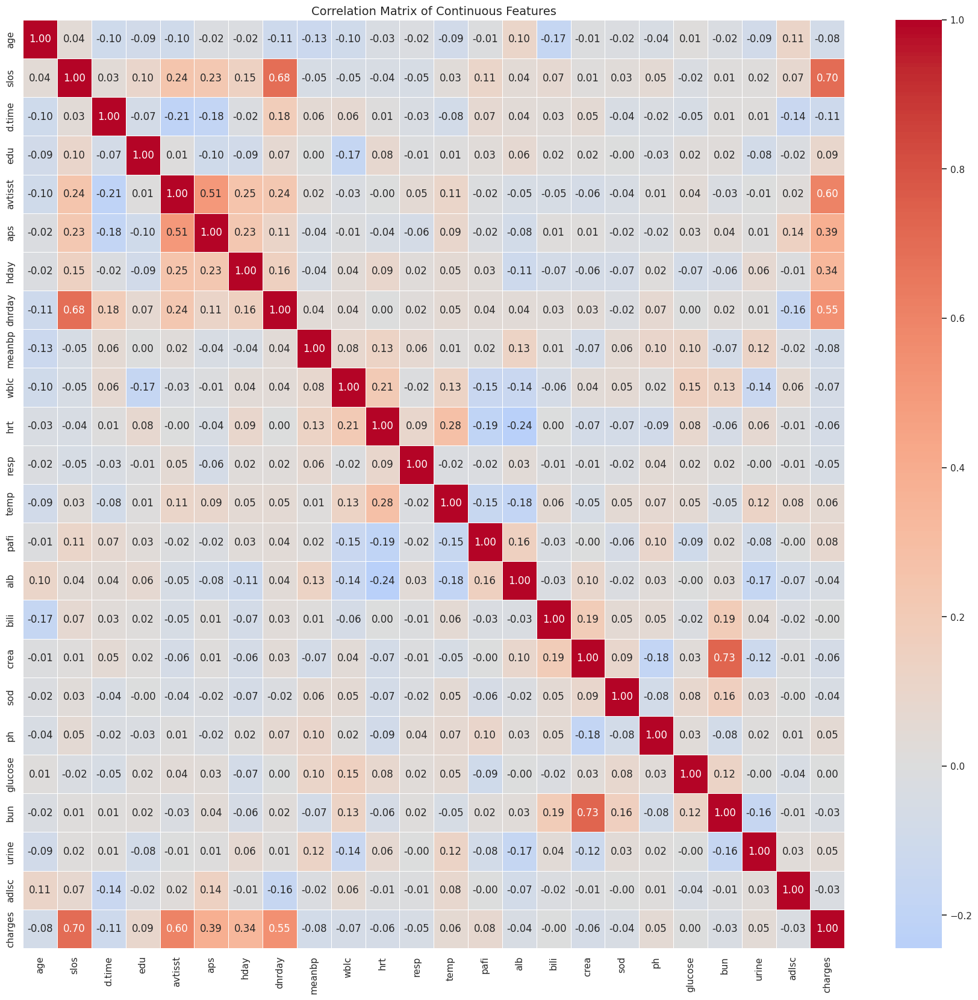

In [133]:
# compute correlation matrix for continuous features
corr = train_df[continuous_features].corr()

# set up the plot
plt.figure(figsize=(22,20))
sns.heatmap(
    corr,
    annot=True,        # show correlation values
    fmt=".2f",         # format with 2 decimal places
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar=True
)
plt.title("Correlation Matrix of Continuous Features", fontsize=14)
plt.show()

In [134]:
# Filtering only those columns where absolute correlation > 0.5 with Target Variable
# Adjust the threshold if no variable is selected
correlation_with_target = corr['charges']  # assuming 'charges' is the target variable
filtered_corr = correlation_with_target[abs(correlation_with_target) > 0.5]

# Display the filtered correlations
print(filtered_corr)

slos       0.701504
avtisst    0.602730
dnrday     0.545374
charges    1.000000
Name: charges, dtype: float64


**Summary**
- The heatmap shows that **slos** ,**avtisst** and **dnrday** have strong correlations with the target (above 0.5), but since **slos** and **dnrday** are **also highly correlated with each other**, we selected only the one **most correlated with the target** to avoid redundancy.
- Final selected continuous features : **`slos`, `avtisst`**

### **12.3.2. Relationship exploration: Categorical Vs Continuous -- Box Plots**
---

####**12.3.2.1. Visual exploration**

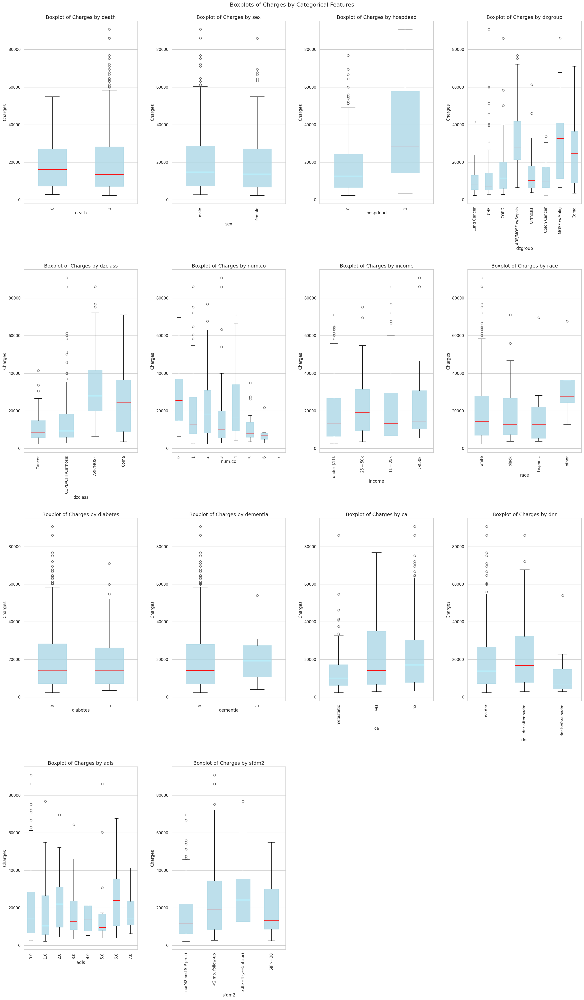

In [135]:
# Calculate number of rows and columns for a 4x4 matrix
n_cols = 4
n_rows = (len(categorical_features[0]) + n_cols - 1) // n_cols  # Ensure enough rows for all plots
fig, PlotCanvas = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols * 6, n_rows * 10))
PlotCanvas = PlotCanvas.flatten()
sns.set(style="whitegrid")

# Creating box plots for each categorical feature against the Target Variable "charges"
for i, PredictorCol in enumerate(categorical_features[0]):
    sns.boxplot(data=train_df, x=PredictorCol, y="charges", ax=PlotCanvas[i], palette="Set2",
                width=0.5, fliersize=6, linewidth=1.2,
                boxprops=dict(facecolor="skyblue", color="lightblue", alpha=0.8),
                medianprops=dict(color="red"),
                whiskerprops=dict(color="black"),
                capprops=dict(color="black"))

    # Set plot title and labels with adjustments
    PlotCanvas[i].set_title(f'Boxplot of Charges by {PredictorCol}', fontsize=14)
    PlotCanvas[i].set_xlabel(PredictorCol, fontsize=12)
    PlotCanvas[i].set_ylabel('Charges', fontsize=12)
    PlotCanvas[i].tick_params(axis='x', rotation=90)  # Rotate x-axis labels for readability

# Hide any empty subplots (if there are more subplots than features)
for j in range(i + 1, len(PlotCanvas)):
    PlotCanvas[j].axis('off')

# Adjust layout and spacing to fit in Colab
plt.tight_layout(pad=3.0)  # Add padding between subplots
plt.suptitle('Boxplots of Charges by Categorical Features', fontsize=16, y=1)

# Show the plot
plt.show()

#### **12.3.2.2. Statistical Feature Selection**
---

In [136]:
train_df['num_co_bin'] = pd.cut(train_df['num.co'], bins=[-1, 0, 1, 2, 3, 5, 10], labels=['0','1','2','3','4-5','6+'])

In [137]:
import numpy as np
import pandas as pd
from scipy.stats import f_oneway

def anova_for_categoricals(
    input_data: pd.DataFrame,
    target_variable: str,
    categorical_features,
    *,
    alpha: float = 0.05,
    min_group_size: int = 2
):
    # Flatten any nested lists/tuples and keep only strings
    flat = []
    for p in categorical_features:
        if isinstance(p, (list, tuple, np.ndarray)):
            flat.extend([q for q in p if isinstance(q, str)])
        elif isinstance(p, str):
            flat.append(p)

    # Keep only existing columns
    predictors = [p for p in flat if p in input_data.columns]
    dropped = [p for p in flat if p not in input_data.columns]
    if dropped:
        print(f"[info] Skipping non-existent columns: {dropped}")

    selected = []
    print("------- ANOVA Results -------\n")

    for predictor in predictors:
        # Drop rows missing predictor or target
        data = input_data.dropna(subset=[predictor, target_variable]).copy()
        if data.empty:
            print(f"{predictor} has no data after dropping NA, skipping.")
            continue

        # Special-case binning for 'num.co'
        if predictor == 'num.co':
            data[predictor] = pd.cut(
                data[predictor],
                bins=[-1, 0, 1, 2, 3, 5, np.inf],
                labels=['0','1','2','3','4-5','6+'],
                include_lowest=True,
                right=True
            )
        # Otherwise, if it's numeric, treat as categorical by casting to string
        elif pd.api.types.is_numeric_dtype(data[predictor]):
            data[predictor] = data[predictor].astype(str)
        else:
            data[predictor] = data[predictor].astype(str)

        # Group target by category
        groups = data.groupby(predictor)[target_variable].apply(list)

        # Ensure each group has enough samples
        if any(len(g) < min_group_size for g in groups):
            print(f"{predictor} still has a group with <{min_group_size} samples, skipping ANOVA.")
            continue

        # Run one-way ANOVA
        try:
            stat = f_oneway(*groups)
            p = stat.pvalue
            if p < alpha:
                print(f"{predictor} is significantly correlated with {target_variable} | P-Value: {p:.6g}")
                selected.append(predictor)
            else:
                print(f"{predictor} is NOT significantly correlated with {target_variable} | P-Value: {p:.6g}")
        except Exception as e:
            print(f"Error with {predictor}: {e}")

    return selected

In [138]:
categorical_predictors = categorical_features

target_variable = 'charges'
significant_predictors = anova_for_categoricals(train_df, target_variable, categorical_predictors)
print("\nSignificant predictors:", significant_predictors)

------- ANOVA Results -------

death is NOT significantly correlated with charges | P-Value: 0.151041
sex is NOT significantly correlated with charges | P-Value: 0.419309
hospdead is significantly correlated with charges | P-Value: 4.89907e-12
dzgroup is significantly correlated with charges | P-Value: 1.32045e-19
dzclass is significantly correlated with charges | P-Value: 2.03498e-22
num.co is significantly correlated with charges | P-Value: 0.0151058
income is NOT significantly correlated with charges | P-Value: 0.151689
race is NOT significantly correlated with charges | P-Value: 0.324678
diabetes is NOT significantly correlated with charges | P-Value: 0.606932
dementia is NOT significantly correlated with charges | P-Value: 0.932217
ca is significantly correlated with charges | P-Value: 0.00195165
dnr is NOT significantly correlated with charges | P-Value: 0.110521
adls is NOT significantly correlated with charges | P-Value: 0.427075
sfdm2 is significantly correlated with charges |

## **12.3.3.Non-linear Checking by using Mutual Information**
---

In [139]:
categorical_features = ['death', 'sex', 'hospdead', 'dzgroup',
          'dzclass', 'num.co', 'income',
          'race', 'diabetes', 'dementia', 'ca',
          'dnr', 'adls', 'sfdm2']

In [140]:
miX = pd.concat([
    pd.get_dummies(train_df[categorical_features], drop_first=True),
    train_df[continuous_features].drop(columns=['charges'])
], axis=1)

miy = train_df['charges']

# Compute mutual information
mi = mutual_info_regression(miX, miy, random_state=0)

# Show all results (threshold = 0)
for feature, score in sorted(zip(miX.columns, mi), key=lambda x: x[1], reverse=True):
    if score > 0:
        print(f"{feature:20s} : {score:.4f}")

slos                 : 0.4405
avtisst              : 0.2716
dnrday               : 0.2653
meanbp               : 0.0930
aps                  : 0.0901
dzclass_COPD/CHF/Cirrhosis : 0.0887
hospdead             : 0.0775
d.time               : 0.0706
sfdm2_no(M2 and SIP pres) : 0.0663
death                : 0.0647
hday                 : 0.0640
hrt                  : 0.0554
urine                : 0.0532
dzclass_Cancer       : 0.0468
pafi                 : 0.0436
wblc                 : 0.0366
bili                 : 0.0366
dzgroup_Lung Cancer  : 0.0359
num.co               : 0.0337
dzgroup_CHF          : 0.0260
adlsc                : 0.0183
dzgroup_COPD         : 0.0144
dzgroup_Coma         : 0.0141
dzclass_Coma         : 0.0141
ca_no                : 0.0129
sod                  : 0.0123
edu                  : 0.0094
dzgroup_MOSF w/Malig : 0.0087
ca_yes               : 0.0079
temp                 : 0.0065
dnr_dnr before sadm  : 0.0065
dzgroup_Colon Cancer : 0.0041
sex_male             : 0.0039

## **12.4. Selecting final predictors for Machine Learning summary**
---

In [141]:
SelectedColumns=['slos','avtisst','hospdead', 'dzgroup', 'dzclass', 'num.co', 'ca', 'sfdm2']

## **12.5. Data Preprocessing**
---

**Features Type**

 **Binary Features**
- **hospdead** – 0/1. Selected  

---

**Ordinal Features**
- **ca** – Ordinal (no < yes < metastatic). Selected  
- **sfdm2** – Ordinal (disability scale 1–5). Selected  

---

**Nominal Features**
- **dzgroup** – Detailed disease group. Selected  
- **dzclass** – Broad disease class. Selected  
- **num.co** – Integer count. Selected  
- **scoma** – Nominal. Selected  

---

 **Numerical Features**
- **slos** – Numeric. Selected  
- **avtisst** – Numeric. Selected
---

### **12.5.1. Converting the ordinal variable to numeric**
---

In [142]:
df_pp = train_df.copy()

In [143]:
# Example mappings (adjust based on your dataset meaning)
ca_mapping = {
    "no": 0,
    "yes": 1,
    "metastatic": 2
}

sfdm2_mapping = {
    "<2 mo. follow-up": 0,
    "no(M2 and SIP pres)": 1,
    "adl>=4 (>=5 if sur)": 2,
    "SIP>=30": 3,
    "Coma or Intub": 4
}

# apply mappings for df.train
df_pp["ca"] = df_pp["ca"].map(ca_mapping)
df_pp["sfdm2"] = df_pp["sfdm2"].map(sfdm2_mapping)

# apply mappings for X_test
X_test["ca"] = X_test["ca"].map(ca_mapping)
X_test["sfdm2"] = X_test["sfdm2"].map(sfdm2_mapping)

### **12.5.2 Converting the binary nominal variable to numeric using 1/0 mapping**
---

In [144]:
# List of binary features
binary_features = ['hospdead']
df_pp[binary_features].head()

,hospdead
7200,0
8765,0
2936,0
8684,0
7426,0


In [145]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in df_pp.columns:
        # If already numeric, skip
        if df_pp[col].dtype == 'object':
            # Map common binary representations to 0/1
            df_pp[col] = df_pp[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            df_pp[col] = df_pp[col].astype(int)

# Verify conversion
df_pp[binary_features].head()

,hospdead
7200,0
8765,0
2936,0
8684,0
7426,0


In [146]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in X_test.columns:
        # If already numeric, skip
        if X_test[col].dtype == 'object':
            # Map common binary representations to 0/1
            X_test[col] = X_test[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            X_test[col] = X_test[col].astype(int)

# Verify conversion
X_test[binary_features].head()

,hospdead
7172,0
7610,1
935,0
4976,0
2844,0


### **12.5.3. Converting the nominal variable to numeric using get_dummies()**
---

In [147]:
# One-hot encode and merge into df_preprocessing
df_pp = pd.get_dummies(
    df_pp,
    columns=["dzgroup", "dzclass", "num.co"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

In [148]:
df_pp.filter(regex=r'^dzgroup_').head()

,dzgroup_ARF/MOSF w/Sepsis,dzgroup_CHF,dzgroup_COPD,dzgroup_Cirrhosis,dzgroup_Colon Cancer,dzgroup_Coma,dzgroup_Lung Cancer,dzgroup_MOSF w/Malig
7200,False,False,False,False,False,False,True,False
8765,False,False,False,False,False,False,True,False
2936,False,True,False,False,False,False,False,False
8684,False,False,True,False,False,False,False,False
7426,False,True,False,False,False,False,False,False


In [149]:
# Remove the binned helper column
if 'num_co_bin' in df_pp.columns:
    df_pp = df_pp.drop(columns=['num_co_bin'])

# Confirm it's gone
print(df_pp.filter(regex=r'^num.co_').head())

      num.co_0  num.co_1  num.co_2  num.co_3  num.co_4  num.co_5  num.co_6  \
7200     False     False      True     False     False     False     False   
8765     False     False      True     False     False     False     False   
2936     False     False     False     False     False      True     False   
8684     False     False     False      True     False     False     False   
7426     False      True     False     False     False     False     False   

      num.co_7  
7200     False  
8765     False  
2936     False  
8684     False  
7426     False  


In [150]:
dummy_cols = [col for col in df_pp.columns if re.match(r'^(dzgroup|dzclass|num.co)_', col)]

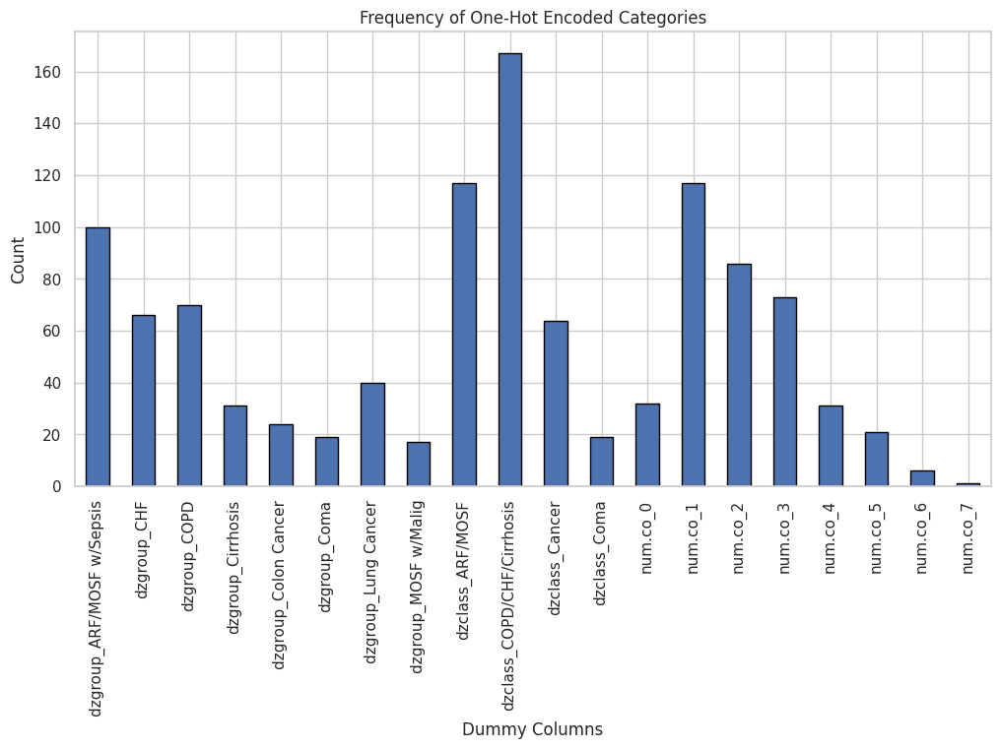

In [151]:
# Count how many 1's in each dummy column
dummy_counts = df_pp[dummy_cols].sum()

plt.figure(figsize=(12, 6))
dummy_counts.plot(kind="bar", edgecolor="black")
plt.title("Frequency of One-Hot Encoded Categories")
plt.ylabel("Count", fontsize=12)
plt.xlabel("Dummy Columns", fontsize=12)
plt.xticks(rotation=90)
plt.show()

In [152]:
# One-hot encode and merge into df_preprocessing
X_test = pd.get_dummies(
    X_test,
    columns=["dzgroup", "dzclass", "num.co"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

In [153]:
# Remove the binned helper column
if 'num_co_bin' in X_test.columns:
    X_test = X_test.drop(columns=['num_co_bin'])

# Confirm it's gone
print(X_test.filter(regex=r'^num.co_').head())

      num.co_0  num.co_1  num.co_2  num.co_3  num.co_4  num.co_5  num.co_6  \
7172     False     False     False      True     False     False     False   
7610     False     False      True     False     False     False     False   
935      False     False     False     False      True     False     False   
4976     False      True     False     False     False     False     False   
2844     False     False     False      True     False     False     False   

      num.co_8  
7172     False  
7610     False  
935      False  
4976     False  
2844     False  


In [154]:
dummy_cols = [col for col in X_test.columns if re.match(r'^(dzgroup|dzclass|num.co|scoma|)_', col)]

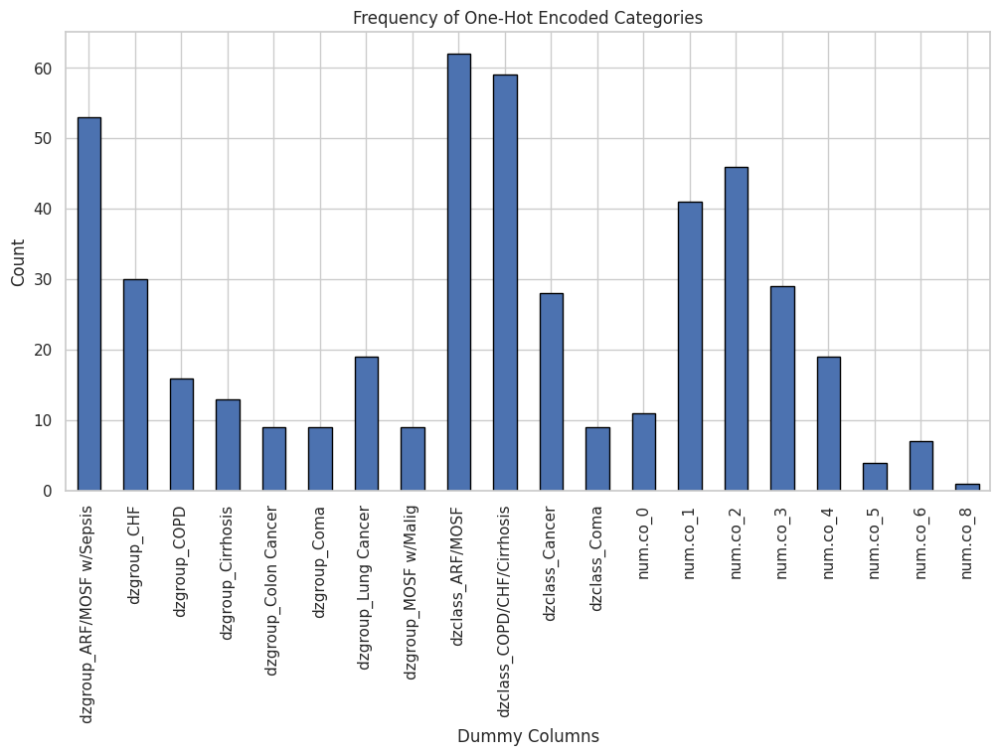

In [155]:
# Count how many 1's in each dummy column
dummy_counts = X_test[dummy_cols].sum()

plt.figure(figsize=(12, 6))
dummy_counts.plot(kind="bar", edgecolor="black")
plt.title("Frequency of One-Hot Encoded Categories")
plt.ylabel("Count")
plt.xlabel("Dummy Columns")
plt.xticks(rotation=90)
plt.show()

### **12.5.4. Data Transformation**
---

#### **12.5.4.1. Transformation on Training Data**
---

**Fixing Skewness**


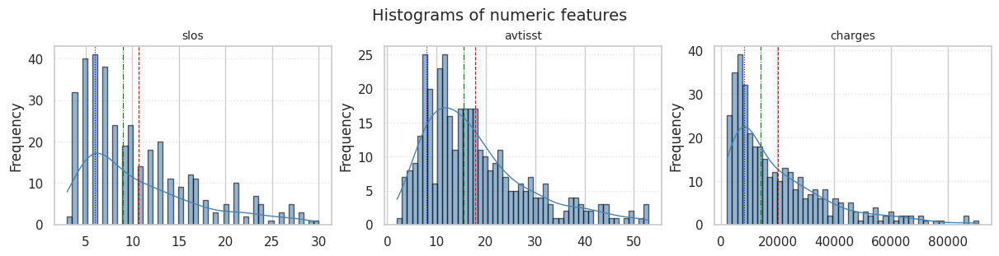

In [156]:
plot_hist_grid(df_pp, ['slos','avtisst','charges'], bins=50, n_cols=3)

In [157]:
# Copy to avoid messing up the original df_clean
df_skewfix = df_pp.copy()

In [158]:
# Apply cube root transform
for col in []:
    # Handle potential negative values before cube root
    df_pp[col] = np.cbrt(df_pp[col].clip(lower=0))   # cube root

# Apply log transform (add +1 to avoid log(0) errors)
for col in ['slos','avtisst','charges']:
    # Add a small constant and handle potential negative values before log
    df_pp[col] = np.log1p(df_pp[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
df_pp.replace([np.inf, -np.inf], np.nan, inplace=True)

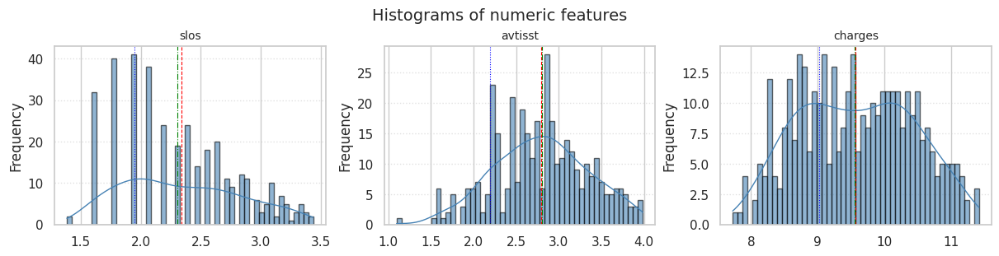

,0
slos,0
avtisst,0
charges,0


In [159]:
# Check histograms again
plot_hist_grid(df_pp, ['slos','avtisst','charges'], bins=50, n_cols=3)
# Check missing values in transformed columns
check_cols = ['slos','avtisst','charges']
df_pp[check_cols].isnull().sum()

**Standardization**

In [160]:
cols_to_standardize = ['slos','avtisst']
df_std = df_pp[cols_to_standardize].copy()

In [161]:
from sklearn.preprocessing import StandardScaler

# create scaler
scaler = StandardScaler()

# fit + transform only the selected columns
df_std[cols_to_standardize] = scaler.fit_transform(df_std[cols_to_standardize])

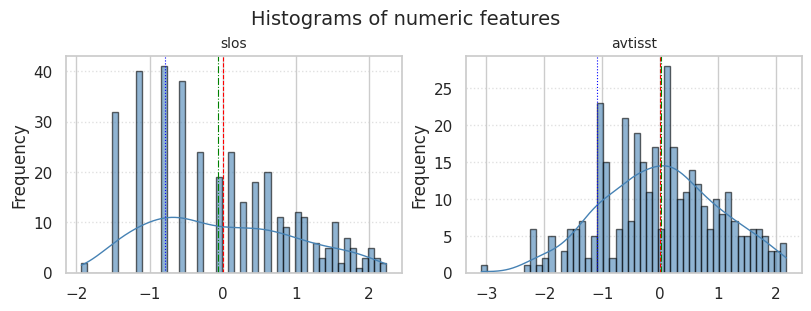

,0
slos,0
avtisst,0


In [162]:
# Check histograms again
plot_hist_grid(df_std, ['slos','avtisst'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos','avtisst']
df_std[check_cols].isnull().sum()

In [163]:
print(df_std.head())
print(df_std.shape)

          slos   avtisst
7200 -1.107505  1.051385
8765 -0.521738 -1.541684
2936 -0.281913  0.181321
8684 -1.107505 -1.083205
7426 -1.478740 -1.298080
(367, 2)


In [164]:
df_pp[cols_to_standardize] = df_std[cols_to_standardize]

#### **12.5.4.2. Transformation on Testing Data**

**Fixing Skewness**

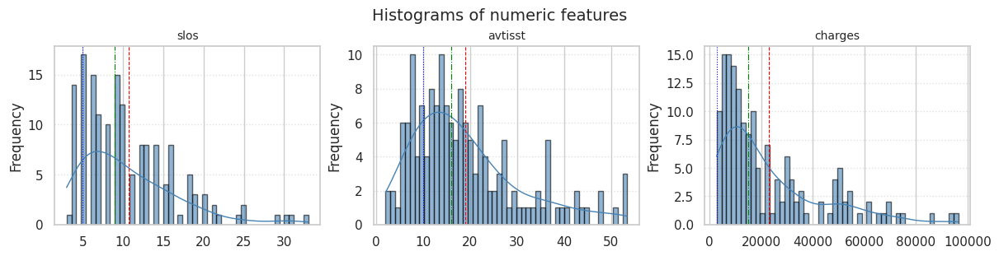

In [165]:
plot_hist_grid(test_df, ['slos','avtisst','charges'], bins=50, n_cols=3)

In [166]:
dft_skewfix = test_df.copy()

In [167]:
# Apply cube root transform
for col in []:
    # Handle potential negative values before cube root
    dft_skewfix[col] = np.cbrt(dft_skewfix[col].clip(lower=0))   # cube root

# Apply log transform (add +1 to avoid log(0) errors)
for col in ['slos','avtisst','charges']:
    # Add a small constant and handle potential negative values before log
    dft_skewfix[col] = np.log1p(dft_skewfix[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
dft_skewfix.replace([np.inf, -np.inf], np.nan, inplace=True)

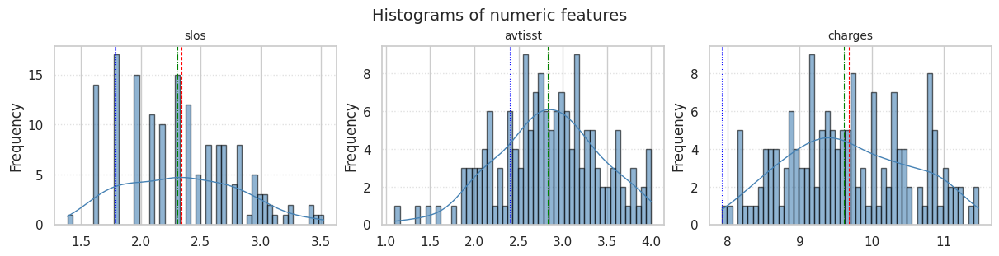

,0
slos,0
avtisst,0
charges,0


In [168]:
# Check histograms again
plot_hist_grid(dft_skewfix, ['slos','avtisst','charges'], bins=50, n_cols=3)
# Check missing values in transformed columns
check_cols = ['slos','avtisst','charges']
dft_skewfix[check_cols].isnull().sum()

In [169]:
X_test[['slos','avtisst']] = dft_skewfix[['slos','avtisst']]
y_test[['charges']] = dft_skewfix[['charges']]

**Standardization**

In [170]:
dft_std = X_test[cols_to_standardize].copy()

In [171]:
dft_std[cols_to_standardize] = scaler.transform(dft_std[cols_to_standardize])

print(dft_std.head())
print(dft_std.shape)

          slos   avtisst
7172 -0.067382 -1.822905
7610 -0.793629 -1.083205
935   0.758209  1.008957
4976  0.126684  0.129928
2844  1.013061  0.311684
(158, 2)


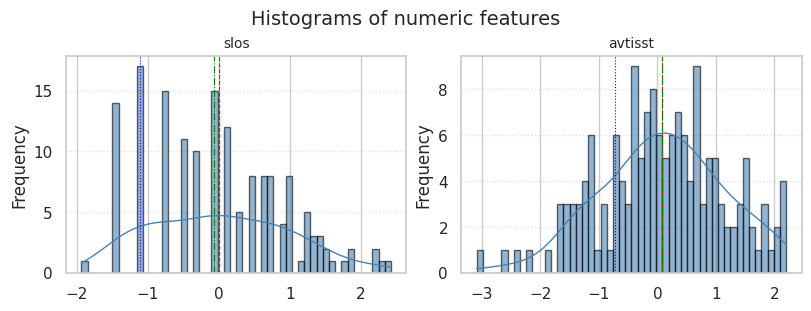

,0
slos,0
avtisst,0


In [172]:
# Check histograms again
plot_hist_grid(dft_std, ['slos','avtisst'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos','avtisst']
dft_std[check_cols].isnull().sum()

In [173]:
X_test[['slos','avtisst']] = dft_std[['slos','avtisst']]

## **12.6. Model Construction (Model 2)**
---

In [174]:
RegModel = LinearRegression()
# Or you can find best hyperparameters using GridSearchCV
# Printing all the parameters of Linear regression
targets_vars = ['charges']

dummy_cols = [col for col in df_pp.columns if re.match(r'^(dzgroup|dzclass|num.co|)_', col)]

predictors_var_train = ['slos','avtisst', 'hospdead',
                'ca', 'sfdm2'] + dummy_cols

dummy_cols = [col for col in X_test.columns if re.match(r'^(dzgroup|dzclass|num.co|)_', col)]

predictors_var_test = ['slos','avtisst', 'hospdead',
                'ca', 'sfdm2'] + dummy_cols

X_train=df_pp[predictors_var_train].values
y_train=df_pp[targets_vars].values

X_test=X_test[predictors_var_test].values
y_test=y_test[targets_vars].values


print(RegModel)

LinearRegression()


In [175]:
LREG=RegModel.fit(X_train,y_train)

In [176]:
# Printing some sample values of prediction
print("Training result prediction")
TrainingPrediction_array = LREG.predict(X_train)
TrainingPrediction=pd.DataFrame(TrainingPrediction_array, columns=['Predictedcharges']) # Convert to DataFrame
TrainingDataResults=pd.DataFrame(data=X_train, columns=predictors_var_train)
TrainingDataResults['charges']=y_train
TrainingDataResults['Predictedcharges']=TrainingPrediction['Predictedcharges'] # Assign from the DataFrame

# Printing sample prediction values
print(TrainingDataResults.head())

Training result prediction
       slos   avtisst hospdead ca sfdm2 dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF  \
0 -1.107505  1.051385        0  2     1                     False       False   
1 -0.521738 -1.541684        0  2     0                     False       False   
2 -0.281913  0.181321        0  1     1                     False        True   
3 -1.107505 -1.083205        0  0     1                     False       False   
4  -1.47874  -1.29808        0  0     1                     False        True   

  dzgroup_COPD dzgroup_Cirrhosis dzgroup_Colon Cancer  ... num.co_0 num.co_1  \
0        False             False                False  ...    False    False   
1        False             False                False  ...    False    False   
2        False             False                False  ...    False    False   
3         True             False                False  ...    False    False   
4        False             False                False  ...    False     True   

  num

In [177]:
TrainingDataResults['charges'] = np.expm1(TrainingDataResults['charges'])
TrainingDataResults['Predictedcharges'] = np.expm1(TrainingDataResults['Predictedcharges'])

print(TrainingDataResults[['charges', 'Predictedcharges']].head())

   charges  Predictedcharges
0   5674.0       9677.877951
1   4495.0       6108.256556
2  13773.0      10229.915932
3   3524.0       4888.913205
4   4054.0       4043.931390


In [178]:
LREG.coef_

array([[ 0.52063674,  0.28450574,  0.30214141, -0.03708026,  0.02736932,
         0.0050268 , -0.03144175, -0.05009365, -0.00523566,  0.04472545,
        -0.06103168, -0.02477014,  0.12282063,  0.12784743, -0.08677107,
         0.01995531, -0.06103168,  0.09264579, -0.01838175, -0.04685301,
        -0.0644319 ,  0.05414237, -0.09736211, -0.20098457,  0.28122518]])

In [179]:
LREG.intercept_

array([9.55364286])

In [180]:
LREG.n_features_in_

25

### **12.6.1. Training result prediction**
---

In [181]:
# Printing some sample values of prediction
print("Training result prediction")
TrainingPrediction_array = LREG.predict(X_train)
TrainingPrediction=pd.DataFrame(TrainingPrediction_array, columns=['Predictedcharges']) # Convert to DataFrame
TrainingDataResults=pd.DataFrame(data=X_train, columns=predictors_var_train)
TrainingDataResults['charges']=y_train
TrainingDataResults['Predictedcharges']=TrainingPrediction['Predictedcharges'] # Assign from the DataFrame

# Printing sample prediction values
print(TrainingDataResults.head())

Training result prediction
       slos   avtisst hospdead ca sfdm2 dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF  \
0 -1.107505  1.051385        0  2     1                     False       False   
1 -0.521738 -1.541684        0  2     0                     False       False   
2 -0.281913  0.181321        0  1     1                     False        True   
3 -1.107505 -1.083205        0  0     1                     False       False   
4  -1.47874  -1.29808        0  0     1                     False        True   

  dzgroup_COPD dzgroup_Cirrhosis dzgroup_Colon Cancer  ... num.co_0 num.co_1  \
0        False             False                False  ...    False    False   
1        False             False                False  ...    False    False   
2        False             False                False  ...    False    False   
3         True             False                False  ...    False    False   
4        False             False                False  ...    False     True   

  num

In [182]:
TrainingDataResults['charges'] = np.expm1(TrainingDataResults['charges'])
TrainingDataResults['Predictedcharges'] = np.expm1(TrainingDataResults['Predictedcharges'])

print(TrainingDataResults[['charges', 'Predictedcharges']].head())

   charges  Predictedcharges
0   5674.0       9677.877951
1   4495.0       6108.256556
2  13773.0      10229.915932
3   3524.0       4888.913205
4   4054.0       4043.931390


### **12.6.2. Testing result prediction**
---

In [183]:
# Printing some sample values of prediction
print("Testing result prediction")
TestingPrediction = LREG.predict(X_test)
TestingDataResults = pd.DataFrame(data=X_test, columns=predictors_var_train)
TestingDataResults['charges'] = y_test
TestingDataResults['Predictedcharges'] = TestingPrediction  # No rounding, keep decimals

# Printing sample prediction values
print(TestingDataResults.head())

Testing result prediction
       slos   avtisst hospdead ca sfdm2 dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF  \
0 -0.067382 -1.822905        0  2     1                     False       False   
1 -0.793629 -1.083205        1  2     0                     False       False   
2  0.758209  1.008957        0  0     1                      True       False   
3  0.126684  0.129928        0  2     2                     False       False   
4  1.013061  0.311684        0  0     1                     False       False   

  dzgroup_COPD dzgroup_Cirrhosis dzgroup_Colon Cancer  ... num.co_0 num.co_1  \
0        False              True                False  ...    False    False   
1        False             False                False  ...    False    False   
2        False             False                False  ...    False    False   
3        False             False                False  ...    False     True   
4        False             False                False  ...    False    False   

  num.

In [184]:
TestingDataResults['charges'] = np.expm1(TestingDataResults['charges'])
TestingDataResults['Predictedcharges'] = np.expm1(TestingDataResults['Predictedcharges'])

print(TestingDataResults[['charges', 'Predictedcharges']].head())

   charges  Predictedcharges
0   7948.0       6611.415365
1   4879.0       8171.949957
2  94457.0      34537.652225
3  12666.0      14971.135561
4  31924.0      22260.853762



### **12.6.3. R-squared of training vs testing**
---

In [185]:
from sklearn import metrics
# Measuring Goodness of fit in Training data by R square
print('R2 Value of training set:',metrics.r2_score(y_train, LREG.predict(X_train)))
print('R2 Value of testing set:',metrics.r2_score(y_test, LREG.predict(X_test)))

R2 Value of training set: 0.8043582599511372
R2 Value of testing set: 0.762194890577895


### **12.6.4. Measuring goodness of fit in training data**
---

#### **12.6.4.1. MAPE, RMSE and MAE of training**
---

In [186]:
#Measuring Goodness of fit in Training data by MAPE
TrainingDataResults['APE']=100 * ((abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))/TrainingDataResults['charges'])
MAPE_training=np.mean(TrainingDataResults['APE'])
RMSE_training = np.sqrt(np.mean((TrainingDataResults['charges']-TrainingDataResults['Predictedcharges'])**2))
MAE_training = np.mean(abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))

In [187]:
print('MAPE on training data:', MAPE_training)
print('RMSE on training data:', RMSE_training)
print('MAE on training data:', MAE_training)
print('% difference between MAE and RMSE',(RMSE_training-MAE_training)*100/MAE_training)
print('Accuracy on training data:', 100-MAPE_training)

MAPE on training data: 30.47759070203767
RMSE on training data: 8925.636360085196
MAE on training data: 5654.7119032790415
% difference between MAE and RMSE 57.844228189758326
Accuracy on training data: 69.52240929796233


####**12.6.4.2. Visualize of Actual vs Predicted on training**
---

<Axes: title={'center': 'Model 2 Actual vs Predected on training'}>

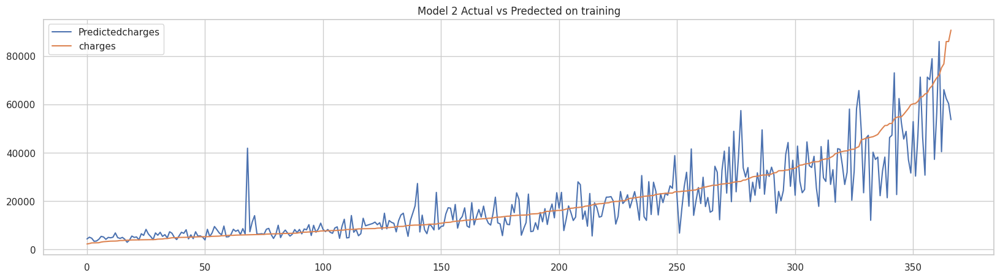

In [188]:
(TrainingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Model 2 Actual vs Predected on training")

<Axes: title={'center': 'Residual on training'}>

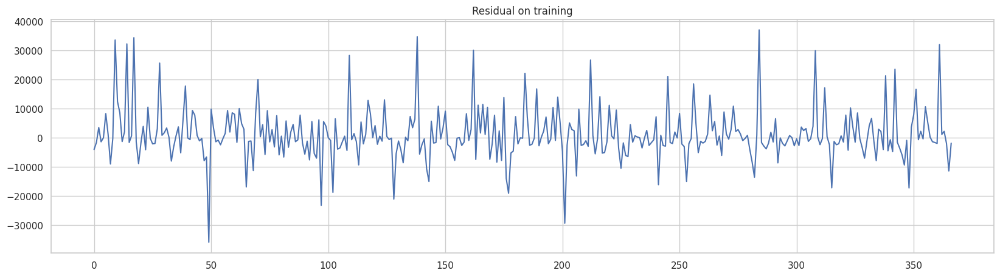

In [189]:
(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']).plot(kind="line",figsize = (20,5),title="Residual on training")

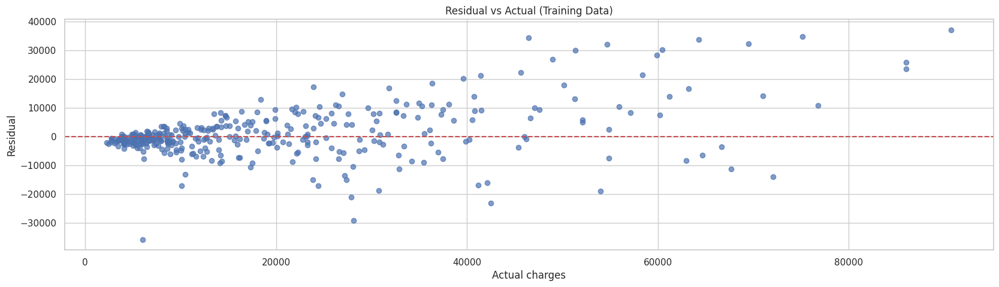

In [190]:
Training_residual = TrainingDataResults['charges'] - TrainingDataResults['Predictedcharges']
plt.figure(figsize=(20, 5))
plt.scatter(TrainingDataResults['charges'], Training_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residual vs Actual (Training Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()

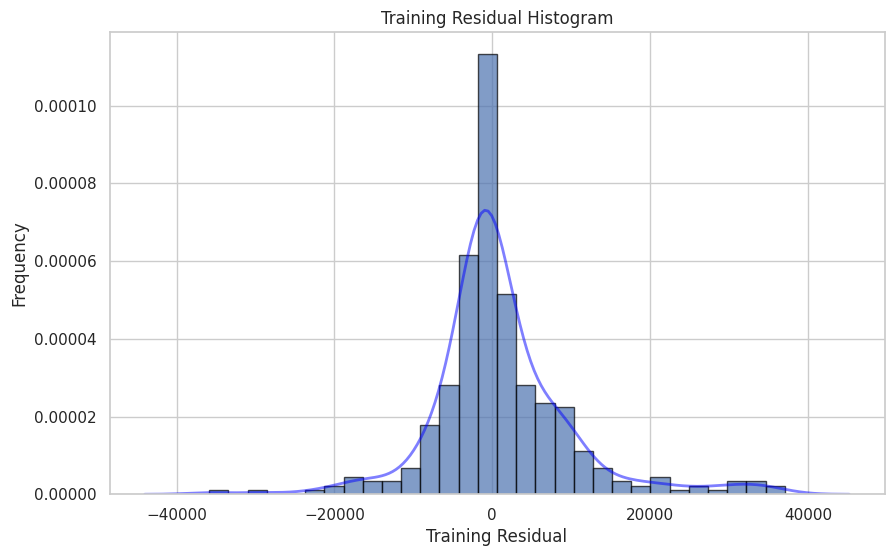

In [191]:
plt.figure(figsize=(10, 6))
plt.hist(Training_residual, bins=30, edgecolor='black', alpha=0.7, density=True)
sns.kdeplot(Training_residual, color='blue', linewidth=2, alpha=0.5)
plt.title('Training Residual Histogram')
plt.xlabel('Training Residual')
plt.ylabel('Frequency')
plt.show()

### **12.6.5. Measuring goodness of fit in testing data**
---

#### **12.6.5.1. MAPE, RMSE and MAE of testing**
---

In [192]:
TestingDataResults['APE']=100 * ((abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))/TestingDataResults['charges'])
MAPE_testing=np.mean(TestingDataResults['APE'])
RMSE_testing = np.sqrt(np.mean((TestingDataResults['charges']-TestingDataResults['Predictedcharges'])**2))
MAE_testing = np.mean(abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))

In [193]:
print('MAPE on test data:', MAPE_testing)
print('RMSE on test data:', RMSE_testing)
print('MAE on test data:', MAE_testing)
print('% difference between MAE and RMSE',(RMSE_testing-MAE_testing)*100/MAE_testing)
print('Accuracy on test data:', 100-MAPE_testing)

MAPE on test data: 32.05408402050876
RMSE on test data: 12202.783232853859
MAE on test data: 7152.153188469264
% difference between MAE and RMSE 70.6169164906485
Accuracy on test data: 67.94591597949125


#### **12.6.5.1. Visualize of Actual vs Predicted on testing**
---

<Axes: title={'center': 'Model 2 Actual vs Predected on testing'}>

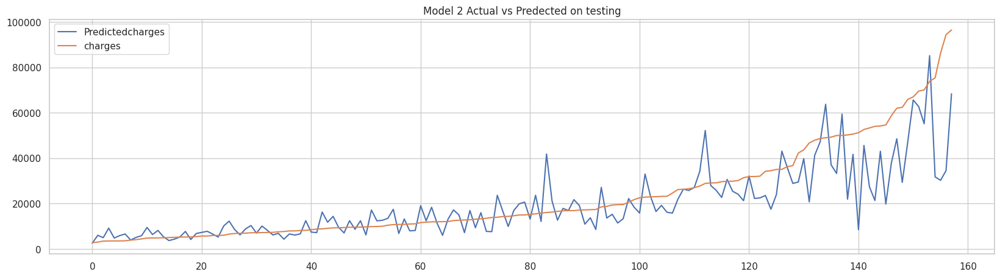

In [194]:
(TestingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Model 2 Actual vs Predected on testing")

<Axes: title={'center': 'Residual on training'}>

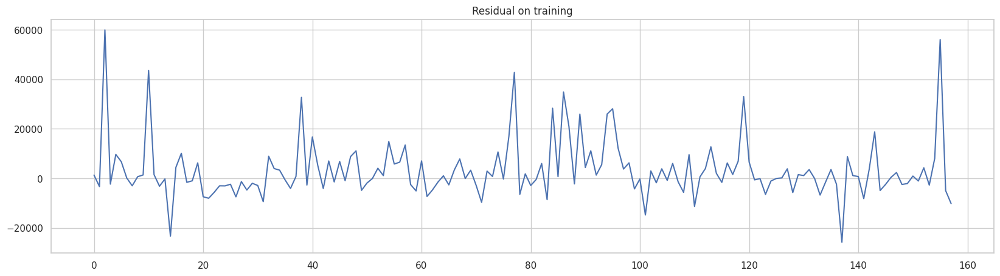

In [195]:
(TestingDataResults['charges']-TestingDataResults['Predictedcharges']).plot(kind="line",figsize = (20,5),title="Residual on training")

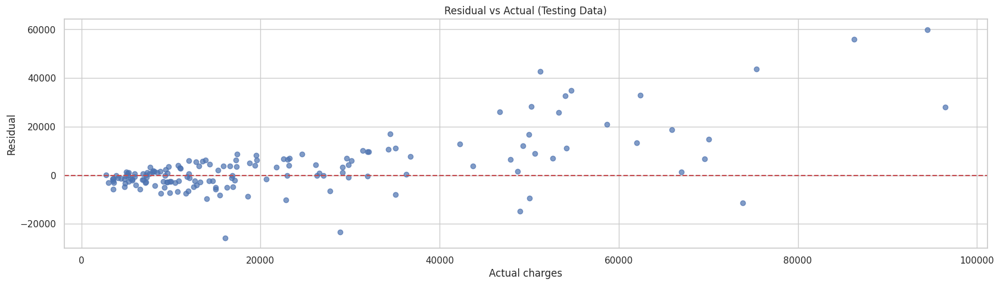

In [196]:
Testing_residual = TestingDataResults['charges'] - TestingDataResults['Predictedcharges']
plt.figure(figsize=(20, 5))
plt.scatter(TestingDataResults['charges'], Testing_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residual vs Actual (Testing Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()

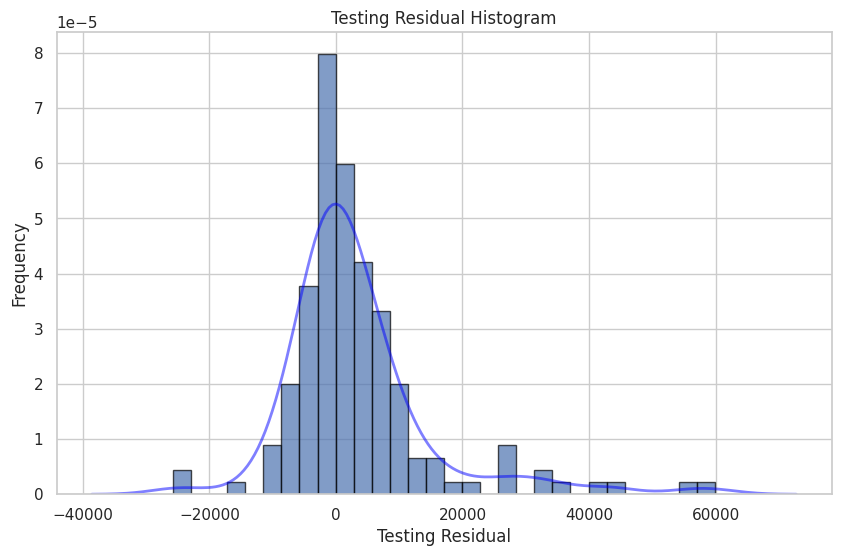

In [197]:
plt.figure(figsize=(10, 6))
plt.hist(Testing_residual, bins=30, edgecolor='black', alpha=0.7, density=True)
sns.kdeplot(Testing_residual, color='blue', linewidth=2, alpha=0.5)
plt.title('Testing Residual Histogram')
plt.xlabel('Testing Residual')
plt.ylabel('Frequency')
plt.show()

# **13. Model Regression Analysis**

---

## **Cost Function Formula and R-squared Analysis**

---

$$
\begin{aligned}
MSE &= \frac{1}{n} \sum_{i=1}^n (y_i - \hat{y}_i)^2 \\[8pt]
RMSE &= \sqrt{\frac{1}{n} \sum_{i=1}^n (y_i - \hat{y}_i)^2} \\[8pt]
MAE &= \frac{1}{n} \sum_{i=1}^n |y_i - \hat{y}_i| \\[8pt]
APE_i &= 100 \times \frac{|y_i - \hat{y}_i|}{y_i} \\[6pt]
MAPE &= \frac{1}{n} \sum_{i=1}^n \left( 100 \times \frac{|y_i - \hat{y}_i|}{y_i} \right) \\[10pt]
R^2 &= 1 - \frac{\sum_{i=1}^n (y_i - \hat{y}_i)^2}{\sum_{i=1}^n (y_i - \bar{y})^2}
\end{aligned}
$$

---

### **Model 1**
- Training R-squared = **0.719**, Testing R-squared = **0.721**
- Training Accuracy = **41.91%**, Testing Accuracy = **41.04%**
- Training MAPE = **58.09%**, Testing MAPE = **58.96%**
- Training MAE = **30,570.87**, Testing MAE = **32,839.07**
- Absolute gap = **2,268.20** (~**7.42%** of training MAE)
- Training RMSE = **76,901.87**, Testing RMSE = **78,811.02**

### **Model 2**
- Training R-squared = **0.804**, Testing R-squared = **0.762**
- Training Accuracy = **69.52%**, Testing Accuracy = **67.95%**
- Training MAPE = **30.48%**, Testing MAPE = **32.05%**
- Training MAE = **5,654.71**, Testing MAE = **7,152.15**
- Absolute gap = **1,497.44** (~**26.48%** of training MAE)
- Training RMSE = **8,925.64**, Testing RMSE = **12,202.78**

---

## **1. Overfitting or not? Why?**
### **Model 1: Cost Function Analysis**
- **MAPE:** The difference between training and testing is **~1**, showing the model has **consistent bias** across datasets and **no overfitting**.  
- **RMSE:** Training and testing RMSE are close, supporting stable generalization.  
- **MAE/Absolute Gap:** Although the gap is small, the **high absolute errors** indicate **weak predictive power**.

### **Quick Summary**
➡ **No overfitting** → train/test gap is very small, but high errors show **poor predictive performance**.

---

### **Model 2: Cost Function Analysis**
- **MAPE:** The difference between training and testing is **~1.6**, still small, indicating **no overfitting**.  
- **RMSE:** Slightly larger difference than Model 1, but still within reasonable range, showing **stable generalization**.  
- **MAE/Absolute Gap:** Gap is proportionally larger (~26%), but **overall errors are much lower**, giving **stronger predictive power**.

### **Quick Summary**
➡ **No overfitting** → train/test gap is slightly larger than Model 1, but **lower absolute errors** and **higher accuracy**.

---

## **2. How accurate is each model? Which model gives the most accuracy? Why?**

### **Model 1: Cost Function Analysis**
- **MAPE:** The difference between training and testing is **~1**, showing the model has **consistent bias** across datasets, but the **high MAPE** indicates poor predictive precision.  
- **Accuracy:** Low accuracy (~42% train, ~41% test) confirms the model has **weak generalization**.  
- **MAE/RMSE:** Large errors ~(30k–32k) and RMSE ~(77k-79k) indicate **high residuals**, reflecting poor model fit.

### **Quick Summary Model 1**
➡ **Model 1 is stable but inaccurate** → Stability comes from the close accuracy on train and test sets, but high residuals, low accuracy, and poor generalization make it **unsuitable for deployment**.

---

### **Model 2: Cost Function Analysis**
- **MAPE:** The difference between training and testing is **~1.6**, showing the model has **low bias** and good precision on both sets.  
- **Accuracy:** Higher accuracy (~70% train, ~68% test) indicates **strong generalization**.  
- **MAE/RMSE:** Lower errors (6k–7k) and RMSE (9k–12k) show **low residuals** and a good model fit.  

### **Quick Summary Model 2**
➡ **Model 2 is inaccurate but still more accurate and reliable than Model 1** → low residuals, high accuracy, and strong generalization make it. **But still unsuitable for deployment** from high MAE/RSME.

---

### **Both Summary**
➡ **Model 2 gives the most accuracy** because it has **lower errors, higher accuracy, and better generalization**. Model 1 fails due to high residuals and poor predictive precision, even though it is stable across training and testing sets.

---  



## **3. Based on the accuracy, can the model be used in real situations?**
---

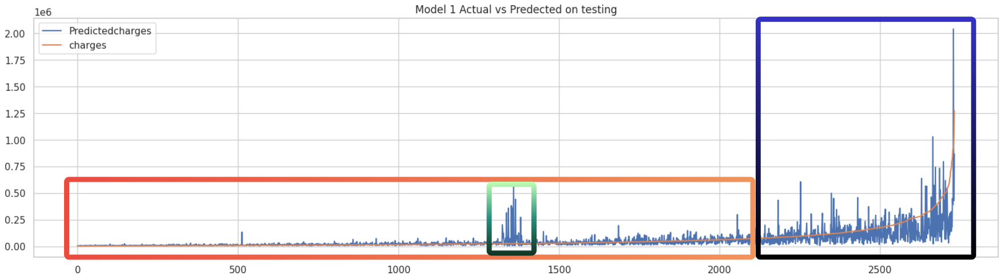

### **Model 1 (No Outlier Treatment)**
- **MAE/RMSE:** Errors (~32,070 MAE and ~74,298 RMSE) are very high, **showing large residuals.**  
- **Accuracy:** Low accuracy (~41.54% testing) confirms **poor predictive performance.**  
- **Visual Analysis:**  
  - **🟥Red Box (Typical of patients):** Most patients fall into this range, where actual charges remain relatively low. The model predictions follow the trend but show **small fluctuations**, reflecting stable performance for common cases.**

  - **🟩Green Box (Middle spike region):** A cluster of sudden spikes in predicted charges appears.  
  These errors are caused by patients with unusual cost patterns, showing that the model struggles with **local irregularities** in the data.

  - **🟦Blue box (High-cost patients):** High-cost patients are concentrated here. The model captures the upward trend but **underestimates or overestimates extreme charges**, confirming the **limitation of linear regression in handling non-linear** cost escalation. These **outliers dominate error** metrics like RMSE, widening the gap from MAE.

### **Summary**
- Model 1 is **not suitable for real-world use** according to the model 1 assumption, **Especially at the Blue box** (Ex. Actual 71501.00,  Predicted 22382.97 : Diff ~50,000).
- Model 1 works **reasonably well for the majority of patients** with typical charges **Red box** (Ex. Actual 20779.0 ,  Predicted 19656.61: Diff ~1000).  
- Performance weakens in **mid-range spikes** (Green box) and **very high-cost cases** at the end of graph (Blue box), where **charges grow non-linearly.**   

---

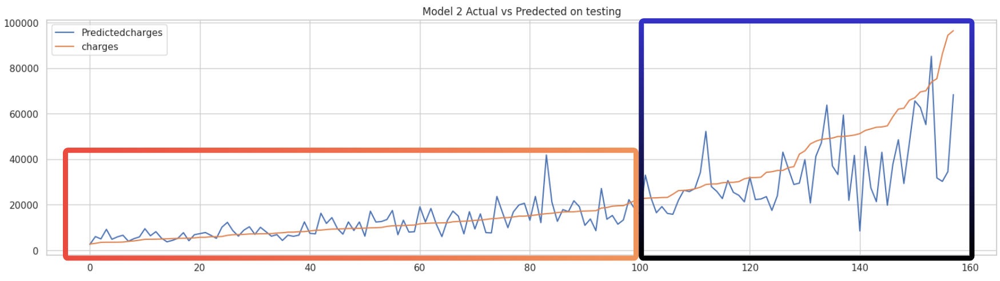

### **Model 2 (With Outlier Treatment)**
- **MAE/RMSE:** Errors (~7,148 MAE and ~12,262 RMSE) are much lower, indicating smaller residuals and a tighter fit.  
- **Accuracy:** Higher accuracy (~68.15% testing) shows moderate predictive reliability.  
- **Visual Analysis:**  
  - **🟥Red box (Typical patients):** For most patients with relatively low charges, the model predictions align closely with the actual values.  
  Small deviations exist, but overall, the line is consistent and captures the general pattern well. This shows that **outlier treatment reduces noise** and allows the regression to fit common cases more effectively.

  - **🟦Blue box (High-cost patients):**  In higher charge ranges, the model still follows the upward trend of actual costs. Predictions are less extreme than in Model 1, showing **better generalization and less distortion from outliers**.  
  However, **fluctuations remain**, especially at the very top end, where costs escalate non-linearly. This indicates that while the outlier treatment improves accuracy, **linear regression still struggles with extreme high-cost cases**.  

### **Summary**
- **Model 2 show the significant improvement**: prediction lines are smoother, residuals are smaller, and accuracy is much higher than Model 1.  
- **Outlier treatment reduces the influence of extreme values**, leading to more reliable predictions for the majority of patients.  
- **The model fails to fully capture the non-linear escalation of costs.** This means it **needs narrower residual range when predicting charges for real-world**, which represents a key limitation of the model.

---

### **Quick Summary**
➡ **Both model** is **not usable** in real-world problem.

➡ **Model 1:** Stable but inaccurate → **underfits the data** and is **not usable for real-world**.  

➡ **Model 2:** Improved accuracy and lower error → **generalizes better**, but still **fails to capture non-linear charge escalation**. So, it's **not reliability in real-world deployment.**

---

## **4. What features are important and sufficient?**

### **Model 1 (No Outlier Treatment)**
- **Feature set used:** `['slos', 'hospdead', 'dzgroup', 'dzclass', 'num.co', 'race', 'diabetes', 'dementia', 'ca', 'dnr', 'sfdm2']`  
- **With outliers included**, some predictors appeared in the model but their importance was **unstable.**  
- Correlations were distorted, making it difficult to identify which features were truly influential.  

---

### **Model 2 (With Outlier Treatment)**
- **Feature set used:** `['slos','avtisst','hospdead','dzgroup','dzclass','num.co', 'ca','sfdm2']`  
- **Dropped from Model 1:** `['race','diabetes','dementia','dnr']`  
- **Added in Model 2:** `['avtisst']`  
- **After outlier removal**, the model produced a smaller, **more stable** set of predictors that explained hospital charges with higher accuracy.  

---

### **Quick Summary**
➡ **Features consistently important in both models (intersection):**  
- **slos (Length of stay):** Longer hospitalization directly raises charges.  
- **hospdead (In-hospital death):** Critical or end-of-life care adds expense.  
- **dzgroup / dzclass (Disease type):** Different diseases require very different levels of resources.  
- **num.co (Comorbidities):** More conditions add complexity and raise costs.    
- **ca (Cancer status):** Especially metastatic cancer strongly drives up charges.  
- **sfdm2 (Functional disability):** Higher disability means longer stays and more support.
---

## **5. How Do Different Settings Affect the Model’s Performance?**

---

### **Redisual vs Actual Scatter Plot**
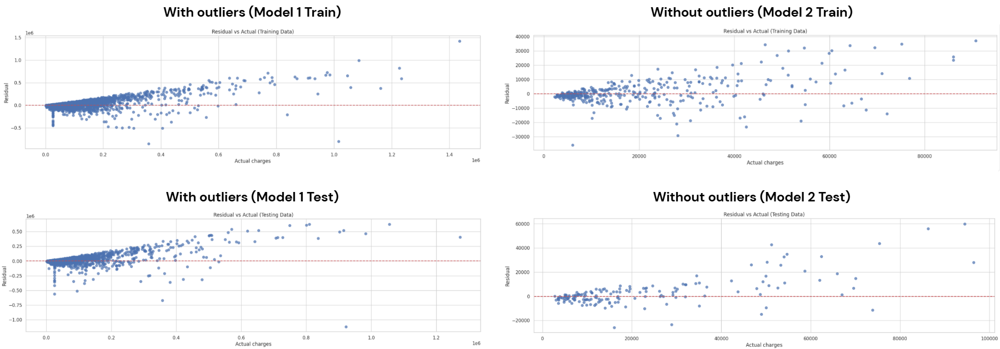

- Both models share the same preprocessing **(transformations, missing value handling, target)**.
- **Heteroscedasticity appears in all plots** → it does **not depend on outlier treatment.**
- This variance pattern may be caused by non-linearity in the data, not by extreme points.
- Outlier removal mainly reduces the scale of residuals, but cannot remove the fan-shaped spread.

---

### **Comparison Between Scatter Plot vs Mutual Information**
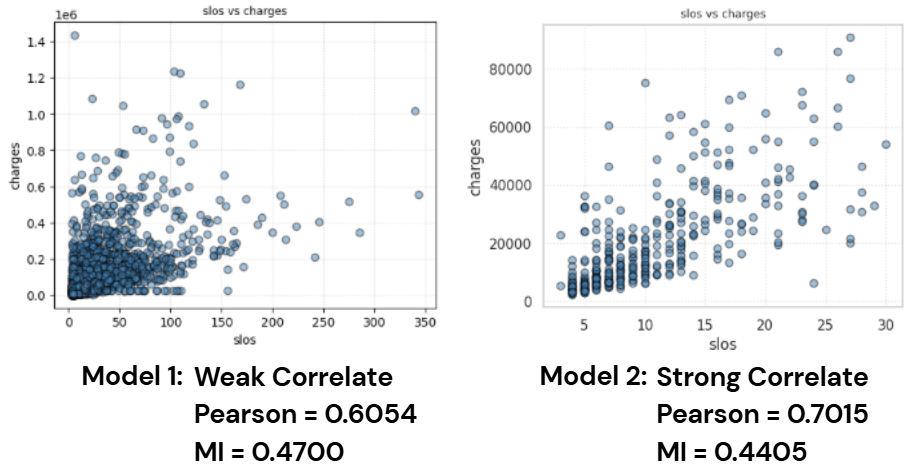
- The scatter plot of `slos` Model 1 is **weak correlation, Pearson = 0.61 and MI value = 0.47**
- The scatter plot of `slos` Model 2 is **strong correlation, Pearson = 0.70 and MI value = 0.44**
- From this picture represent that `slos` have **may have non-linear relationship** which means the heteroscedasticity can cause from this reason.

### **Model 1 (Standardization only, no outlier treatment)**
- Training Accuracy = **41.91%**, Testing Accuracy = **41.04%**  
- Training MAE = **30,570.87**, Testing MAE = **32,839.07**  
- Training RMSE = **76,901.87**, Testing RMSE = **78,811.02**  

**Without outlier treatment**
- Very low accuracy (~41%).
- Very high errors (30k–78k).
- RMSE–MAE gap (150%) → outliers dominate the loss and distort predictions.

---

### **Model 2 (Standardization + outlier treatment in doubtful predictors)**
- Training Accuracy = **69.52%**, Testing Accuracy = **67.95%**  
- Training MAE = **5,654.71**, Testing MAE = **7,152.15**  
- Training RMSE = **8,925.64**, Testing RMSE = **12,202.78**  

**With outlier treatment**
- Accuracy improves significantly (to ~68–70%).
- Errors drop sharply (6–12k vs 30–78k).
- RMSE–MAE gap smaller (~60–70%) → outliers’ influence reduced, but not gone.

---

### **Quick Summary**
➡ Both models use the same preprocessing pipeline, but **Model 2 adds outlier treatment.**
- From checking the selected features using scatter plots, box plots, and mutual information for both models, **heteroscedasticity still appears. Therefore, we assume that it may be caused by the non-linearity of `slos`, not by outliers.**
- Outlier treatment reduces error magnitude and prevents extreme values from dominating.
- Performance improves greatly: **Model 2 is far more accurate and stable than Model 1 by outlier treatment.**

---


## **6. From Residual or Error Analysis, What Characteristics of the Data Make the Model Less Effective? What Is the Limitation?**

### **Model 1**
- Residuals extremely large (MAE > **30k**, RMSE > **76k**).  
- RMSE–MAE gap (150%) → **outliers dominate** the error.  
- Fails to capture the **skewed & non-linear distribution** of charges → very poor accuracy for high-cost patients.  

---

### **Model 2**
- Residuals smaller (MAE ~6–7k, RMSE ~9–12k).  
- RMSE–MAE gap (~60–70%) → extreme charges still matter.  
- Errors concentrate in **very high-cost patients**, where charges rise **non-linearly** with predictors (e.g., *slos*, *meanbp*).  
- Breaks assumptions of **linearity** and **constant variance** in linear regression.  

---

### **Quick Summary**
➡ These two characteristics — **skewness** and **non-linearity** — make linear regression less effective.  
  - The **data is highly skewed**: most patients have low-to-moderate costs, but a few have **extremely high costs**.  
  - The **relationship is non-linear**: cost increases disproportionately with certain predictors (e.g., longer stays, unstable vitals).  

➡ **Model 1:** Overwhelmed by extreme values → fails badly.  
➡ **Model 2:** Outlier treatment reduces error size, but cannot fix the underlying **non-linear data pattern**.  
➡ **Limitation:** The models work for “average” cases but break down for **rare, high-cost cases**, which are most important in practice.

---
## **7. How to Improving the Model for Real-World Proble (Additional)**
➡ **Adopt advanced models:** Try **tree-based ensembles (Random Forest, Gradient Boosting, XGBoost)** or **non-linear regressors (SVR, Neural Nets)** to capture complex, threshold-based, or multiplicative effects in healthcare costs.

➡ **Model robustness:** Explore **robust regression techniques** (e.g., Huber loss, RANSAC) that are less sensitive to extreme outliers.  

➡ **Practical deployment:** In real hospital applications, accurate prediction of **extreme cases** is financially important. A hybrid approach may be needed: **One regression for typical patient and one for high-cost cases** + separate risk models for high-cost patient groups.

---